# Feedback Perseverance Model of the Task Switching Paradigm 

[Github repository of the modeling pproject](https://github.com/esmeralda-25/DynamicalSystemsModelling_TS/tree/main)   

Experiment: *Task switching with letters and numbers*, gitHub repository of the experiment: [task switching with letter and numbers](https://github.com/snamazova/task_switch).  
[The online experiment](https://snamazova.github.io/task_switch/taskswitching.html).


Initial setup and basic imports

In [14]:
# Checking cpu specs for time estimation for the cpu-parallelized code
# from utils import print_cpu_specs
# print_cpu_specs()

In [15]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

plt.rcParams.update({'font.size': 18, 'font.family': "sans-serif"}) # 'font.weight': 'bold'

SAVE_RESULTS = True
RESULTS_DIR = "results"
RAW_DATA_DIR = "data" 
CLEANED_DATA_DIR = "data_cleaned"

SEED = 123

In [16]:
# check if running in Colab
COLAB = False
if os.getenv("COLAB_RELEASE_TAG") or os.getenv("COLAB_GPU"):
   print("Running in Colab")
   # clone the repository
   !git clone https://github.com/esmeralda-25/DynamicalSystemsModelling_TS

    # install additional required packages
   !pip install ipywidgets
   !pip install git+https://github.com/lnccbrown/HSSM.git
   from google.colab import files
   # import hssm          # for additional RT analysis with DDM
   # import hssm.plotting # for additional RT analysis with DDM

   # append the repository to the pyhton path

   import sys
   os.chdir("/content/DynamicalSystemsModelling_TS")
   sys.path.append("/content/repository_name")

   # list the files in the repository
   print('repo files:', os.listdir())
   !ls -lah
   COLAB = True
   
else:
   os.makedirs(RESULTS_DIR, exist_ok=True)
   os.makedirs(CLEANED_DATA_DIR, exist_ok=True)
   os.makedirs(RAW_DATA_DIR, exist_ok=True)
   print("NOT in Colab")

NOT in Colab


## Data Loading
We load one example of the raw data from the experiment and clean it up to fit to the format of the data that we will use in the analysis.

- the loaded and cleaned data can be used later for testing the fitting procedure later instead of simulatied data

In [17]:
from data_cleaning import clean_data

In [18]:
# load the raw data, fit the file name to your data
file_name = os.path.join(RAW_DATA_DIR, "Esma.json")

# upload the file manually if running in Colab
if COLAB:
    uploaded = files.upload()
    # get the filename from the uploaded dictionary
    file_name = list(uploaded.keys())[0]

# if file name does not exist, raise an error
if not os.path.exists(file_name):
    raise FileNotFoundError(f"File {file_name} not found, load a raw data file into data/ folder")

# open and load the JSON file
with open(file_name, "r") as f:
    data = json.load(f)

# convert JSON to a DataFrame
df_raw = pd.json_normalize(data)

# display the DataFrame columns to analyze it
print(df_raw.columns)
print("raw data structure:")
df_raw.head(1)

Index(['rt', 'stimulus', 'response', 'trial_type', 'trial_index',
       'time_elapsed', 'internal_node_id', 'bean_trial_duration',
       'bean_duration', 'bean_stimulus', 'bean_choices', 'bean_correct_key',
       'bean_type', 'bean_text', 'bean_color', 'bean_correct',
       'bean_num_correct', 'bean_accuracy', 'bean_task_type'],
      dtype='object')
raw data structure:


,rt,stimulus,response,trial_type,trial_index,time_elapsed,internal_node_id,bean_trial_duration,bean_duration,bean_stimulus,bean_choices,bean_correct_key,bean_type,bean_text,bean_color,bean_correct,bean_num_correct,bean_accuracy,bean_task_type
0,2900.0,<div style='color:white'>Welcome to our task-s...,,html-keyboard-response,0,2914,0.0-0.0-0.0,NaN,NaN,<div style='color:white'>Welcome to our task-s...,[ ],,jsPsychHtmlKeyboardResponse,Welcome to our task-switching experiment.What ...,white,False,NaN,NaN,NaN


clean and potantionally save the data as a csv file

In [19]:
data_cleaned = clean_data(df_raw)
# data_cleaned.head(5)
data_cleaned.tail(5)

# save the cleaned data to a new file if the file does not exist already
cleaned_file_name = os.path.join(CLEANED_DATA_DIR, os.path.basename(file_name).replace('.json', '.csv'))
if not os.path.exists(cleaned_file_name):
    # replace the file extension with .csv
    data_cleaned.to_csv(cleaned_file_name, index=False)
    print(f"Data cleaned and saved to {cleaned_file_name}")

 data cleaning done. number of valid trails: 98


### Structure of cleaned data 
- task: the task that the participant was asked to perform (letter or number)
- trial_type: the type of trial (switch or repeat)
- response: the key that the participant pressed
- rt: the reaction time of the participant
- accuracy: whether the participant's response was correct
- choice_adjusted: standarized choice variable for both the participants and the models
    - 0: correct response to the letter task (1: incorrect response to the letter task)
    - 1: correct response to the number task (0: incorrect response to the number task)
- participant_response: actual response of the participant from the experiment
- correct_key: correct key for the trial
- key_choices: all possible key choices for the task
- stimuli: the stimuli that the participant was asked to respond to
- trial_index: the index of the trial
- switch: (helper column) whether the trial was a switch trial

## Model Implementation *(3 points)*

For this exercise you should:

*   Implement and simulate data from two* models that are suitable to test your hypothesis. *(3 points)*

<font size=2>*You may implement more than two models if you wish. However, two models are sufficient for this group project.</font>

Make sure to comment your code and provide an explanation for each code block in a preceding text block.


### Models Formulation

<img src="model_depiction.jpg" alt="Model depiction" width="500"/>

The dynamical model is supposed to describe the neural processes underlying task-switching behavior, incorporating **task perseverance** / **switch anticipation effects** as well as **feedback**.   
The system consists of three interacting dynamical variables:

- $x_1$ and $x_2$: Neural activity / attention levels for Task 1 and Task 2.
- $P$: A persistence variable that modulates task perseverance effects, representing higher cognitive controll.

The system is governed by the following differential equations:

#### **Task-Attention Dynamics**
$$
\frac{dx_1}{dt} = -x_1 + S(g, \text{net}_1)
$$
$$
\frac{dx_2}{dt} = -x_2 + S(g, \text{net}_2)
$$

where the **logistic activation function** $S(g, \cdot)$ determines the depth of the attractor of both tasks based on the gain parameter $g$:

$$
S(g, \text{net}) = \frac{1}{1 + e^{-g \cdot \text{net}}}
$$

The **net input** to each task unit is defined as:

$$
\text{net}_1 = -w_{12} x_2 + w_{1P} P + I_1 + \sigma \eta
$$
$$
\text{net}_2 = -w_{21} x_1 - w_{2P} P + I_2 + \sigma \eta
$$

where:
- $w_{12}, w_{21}$ are mutual inhibition weights.
- $w_{1P}, w_{2P}$ modulate the effect of perseverance.
- $I_1, I_2$ are external task inputs.
- $P$ modulates the effect of task perseverance.
- $\sigma \eta$ Gaussian noise.

#### **Persistence (Task Perseverance / switch anticipation) Dynamics**
$$
\frac{dP}{dt} = \tau_P \left( -P + \tanh(\text{net}_P) \right)
$$

$$
\text{net}_P = \gamma (w_{P1} x_1 - w_{P2} x_2) + \alpha F (-\text{Tendency})
$$

where:
- $\gamma$ is the persistence gain.
  - $\gamma > 0$: Task perserverance.
  - $\gamma < 0$: Switch anticipation.
- $F$ is the feedback signal.
- $\alpha$ learning rate of the feedback signal.
- $w_{P1}, w_{P2}$ modulate the effect of task units on persistence dynamics.
- $\text{Tendency}$ is the current tendency of the system

The **Tendency** term aligns the system with the current task dominance and the perseverance mechanism driven by $\gamma$:

$$
\text{Tendency} = sign(\gamma (x_1 - x_2))
$$
$(x_1 - x_2)$ can be interperted as task dominance.

in case of $\gamma = 0$, Tendency will aling with task dominance only.  
     
This formulation captures **how task-switching behavior emerges from neural competition, inhibitory interactions, and feedback-modulated perseverance mechanisms**.

#### Model 1: Baseline Model (2 free parameters)
- $\gamma = 0$: No task perseverance or switch anticipation.
- $F = 0$: No feedback.
- **P** stays at 0. (or decays and stays at 0 if initial value is not 0).  
As result the dynamics of the system are governed by the task activity dynamics only.

#### Model 2: Perseverance Model (3 free parameters)
- $F = 0$: No feedback.
- **P** is governed by the persistence dynamics only.
- $\gamma > 0$: Task perserverance.
- $\gamma < 0$: Switch anticipation.

<!-- #### Model 3: Feedback Model (3 free parameters)
- $\gamma = 0$: No task perseverance or switch anticipation.
- **P** is governed by the persistence dynamics only. -->

#### Model 3: Full Model, incorporating Feedback and Perseverance (4 free parameters)

### Insight into the latent varaibles in a simulation on one trial

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

from model import simulate_dynamics, plot_trajectory
from model_simulation import simulate_experiment, generate_experiment_trials

subDir_modelImplementation = "model_implementation"

In [21]:
from ipywidgets import interact, widgets

def interactive_plot_trial(g, alpha, gamma, x1_0, x2_0, P_0, feedback, tau_P):
    I1 = 1        # Input to task 1
    I2 = 0       # Input to task 2
    sigma = 0.4    # noise
    T = 4         # Simulation time

    x_0 = [x1_0, x2_0, P_0]

    input = [I1, I2]
    np.random.seed(SEED)

    # Run the simulationnear
    ts, x1, x2, P  = simulate_dynamics(T, x_0, g, alpha, gamma, input, feedback, sigma, tau_P,num_sample_points=100)

    # Plot the trajectory
    plt.close('all')
    plot_trajectory(T, ts, x1, x2, P, input=[np.where(np.array(input) != 1)[0][0]], feedback=[feedback])

# Create interactive sliders
g_slider = widgets.FloatSlider(value=1.5, min=0.0, max=5.0, step=0.5, description="Gain (g):")
alpha_slider = widgets.FloatSlider(value=0.1, min=0.0, max=1.0, step=0.1, description="alpha:")
gamma_slider = widgets.FloatSlider(value=0.3, min=-1.0, max=1.0, step=0.1, description="gamma:")
x1_0_slider = widgets.FloatSlider(value=0.5, min=0.0, max=1.0, step=0.1, description="x1_0:")
x2_0_slider = widgets.FloatSlider(value=0.5, min=0.0, max=1.0, step=0.1, description="x2_0:")
P_0_slider = widgets.FloatSlider(value=0.0, min=-1.0, max=1.0, step=0.1, description="P_0:")
tau_P_slider = widgets.FloatSlider(value=1.0, min=0.0, max=1.0, step=0.1, description="tau_P:")
feedback_slider = widgets.IntSlider(value=-1, min=-1, max=1, step=1, description="Feedback:")

# Use the interact function to create the interactive plot
interact(interactive_plot_trial, g=g_slider, alpha=alpha_slider, gamma=gamma_slider ,
         x1_0=x1_0_slider, x2_0=x2_0_slider, P_0=P_0_slider, feedback=feedback_slider, tau_P=tau_P_slider);
plt.close('all')

interactive(children=(FloatSlider(value=1.5, description='Gain (g):', max=5.0, step=0.5), FloatSlider(value=0.…

### Insight into the Dynamics of the two Models across multiple trails

In [22]:
from ipywidgets import interact, widgets
def interactive_plot_experiment(g, c, alpha, gamma, x1_0, x2_0, P_0, tau_P, experiment_trials):
    # simulating a small sample of trials to get an insight into the dynamics for both models
    T = 4
    sigma = 0.3
    c = 0
    x_0 = [x1_0, x2_0, P_0]
    
    # Base Model
    np.random.seed(SEED)
    _ = simulate_experiment(num_trials, T, x_0, g, c, 0, 0, sigma, tau_P, bool_plot_trajectory = True, task_sequence = experiment_trials)

    # Feedback Perseverance Model
    np.random.seed(SEED)
    _ = simulate_experiment(num_trials, T, x_0, g, c, alpha, gamma, sigma, tau_P, bool_plot_trajectory = True, task_sequence = experiment_trials)


num_trials = 20
experiment_trials = generate_experiment_trials(num_trials)

# Create interactive sliders
g_slider = widgets.FloatSlider(value=1.5, min=0.0, max=5.0, step=0.5, description="Gain (g):")
c_slider = widgets.FloatSlider(value=0.0, min=-2.0, max=2.0, step=0.1, description="c:")
alpha_slider = widgets.FloatSlider(value=0.1, min=0.0, max=1.0, step=0.1, description="alpha:")
gamma_slider = widgets.FloatSlider(value=0.5, min=-1.0, max=1.0, step=0.1, description="gamma:")
x1_0_slider = widgets.FloatSlider(value=0.5, min=0.0, max=1.0, step=0.1, description="x1_0:")
x2_0_slider = widgets.FloatSlider(value=0.5, min=0.0, max=1.0, step=0.1, description="x2_0:")
P_0_slider = widgets.FloatSlider(value=0.0, min=-1.0, max=1.0, step=0.1, description="P_0:")
tau_P_slider = widgets.FloatSlider(value=1.0, min=0.0, max=1.0, step=0.1, description="tau_P:")
experiment_trials_fixed = widgets.fixed(experiment_trials)

# Use the interact function to create the interactive plot
interact(interactive_plot_experiment, g=g_slider, c=c_slider, alpha=alpha_slider, gamma=gamma_slider ,x1_0=x1_0_slider, x2_0=x2_0_slider, P_0=P_0_slider, 
                                        experiment_trials=experiment_trials_fixed, tau_P=tau_P_slider);
plt.close('all')

interactive(children=(FloatSlider(value=1.5, description='Gain (g):', max=5.0, step=0.5), FloatSlider(value=0.…

## Model Simulation *(3 points)*

For this exercise you should:

*   Simulate data from both models for a single set of parameters. The simulation should mimic the experiment you are trying to model. *(2 points)*

*   Plot the simulated behavior of both models. The model plots should depict key features of the behavioral data, convincing yourself that the models are suitable to capture the data. *(1 point)*

Make sure to comment your code and provide an explanation for each code block in a preceding text block.


In [ ]:
from model_simulation import simulate_experiment, generate_experiment_trials
from analysis import *

subDir_modelSimulation = "model_simulation"

### Generate surrogate Data from the Models



In [24]:
# simulating surregate data for the experiment on all models
# experiment parameters
num_trials = 100
# hyperparameters
T = 2
sigma = 0.2
tau_P = 2/T
x_0 = [0.5, 0.5, 0]

# free parameters
g = 2
c = 0.0
alpha = 0.1
gamma = 0.4

# generate experiment trials
experiment_trials = generate_experiment_trials(num_trials)
# Base Model
np.random.seed(SEED)
sim_Base = simulate_experiment(num_trials, T, x_0, g, c, 0, 0, sigma, tau_P, bool_plot_trajectory = False, task_sequence = experiment_trials)

# Perseverence Model
np.random.seed(SEED)
sim_P = simulate_experiment(num_trials, T, x_0, g, c, 0, gamma, sigma, tau_P, bool_plot_trajectory = False, task_sequence = experiment_trials)

# # Feedback model
# np.random.seed(SEED)
# sim_F = simulate_experiment(num_trials, T, x_0, g, c, alpha, 0, sigma, tau_P, bool_plot_trajectory = False, task_sequence = experiment_trials)

# Feedback Perseverance model
np.random.seed(SEED)
sim_PF = simulate_experiment(num_trials, T, x_0, g, c, alpha, gamma, sigma, tau_P, bool_plot_trajectory = False, task_sequence = experiment_trials)

In [25]:
# printing samples of the surrogate data
print("Surregate Data from Base Model:")
display(sim_Base.head(10))

print("Surregate Data from Perserverance Model:")
display(sim_P.head(3))

# print("Surregate Data from Feedback Model:")
# display(sim_F.head(3))

print("Surregate Data from Feedback Perseverance Model:")
display(sim_PF.head(3))

print('accuracy base: ', sim_Base['accuracy'].iloc[-1])
print('accuracy perseverance: ', sim_P['accuracy'].iloc[-1])
# print('accuracy feedback: ', sim_F['accuracy'].iloc[-1])
print('accuracy Feedback Perseverance: ', sim_PF['accuracy'].iloc[-1])

Surregate Data from Base Model:


,task,trial_type,response,accuracy,choice_adjusted,activity_n1,activity_n2,correct_responses,trial_index
0,number,switch,1,1.000000,1,0.318212,0.679855,"[0, 1]",1
1,number,repeat,1,1.000000,1,0.204043,0.804881,"[0, 1]",2
2,number,repeat,1,1.000000,1,0.175556,0.832045,"[0, 1]",3
3,letter,switch,0,0.750000,1,0.659183,0.347682,"[1, 0]",4
4,number,switch,1,0.800000,1,0.290061,0.707972,"[0, 1]",5
5,letter,switch,1,0.833333,0,0.707595,0.316850,"[1, 0]",6
6,letter,repeat,1,0.857143,0,0.802465,0.194077,"[1, 0]",7
7,number,switch,0,0.750000,0,0.331698,0.673554,"[0, 1]",8
8,number,repeat,1,0.777778,1,0.198850,0.803609,"[0, 1]",9
9,letter,switch,1,0.800000,0,0.674987,0.341587,"[1, 0]",10


Surregate Data from Perserverance Model:


,task,trial_type,response,accuracy,choice_adjusted,activity_n1,activity_n2,correct_responses,trial_index
0,number,switch,1,1.0,1,0.359665,0.639850,"[0, 1]",1
1,number,repeat,1,1.0,1,0.179729,0.825835,"[0, 1]",2
2,number,repeat,1,1.0,1,0.116597,0.888836,"[0, 1]",3


Surregate Data from Feedback Perseverance Model:


,task,trial_type,response,accuracy,choice_adjusted,activity_n1,activity_n2,correct_responses,trial_index
0,number,switch,1,1.0,1,0.379442,0.617468,"[0, 1]",1
1,number,repeat,1,1.0,1,0.188437,0.793816,"[0, 1]",2
2,number,repeat,1,1.0,1,0.141206,0.850938,"[0, 1]",3


accuracy base:  0.7878787878787878
accuracy perseverance:  0.8080808080808081
accuracy Feedback Perseverance:  0.7373737373737373


### Behavioral insight of the Models

Overall acuuracy over the different conditions (repeat and switch)

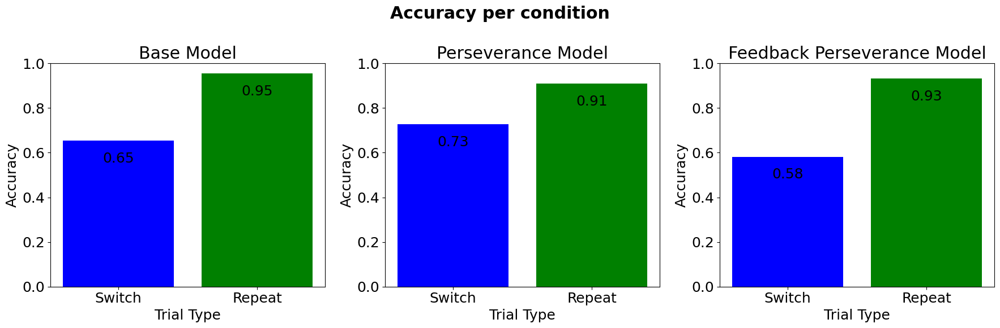

In [ ]:
# Plotting the accuracy per condition of the base and perseverance model
fig, axs = plt.subplots(1, 3, figsize=(18,6))
axs = axs.ravel()
fig.suptitle('Accuracy per condition', fontweight='bold')
acc_cond_base = calculate_accuracy_condition(sim_Base)
plot_accuracy_condition(acc_cond_base, ax=axs[0])
axs[0].set_title('Base Model')

acc_cond_P = calculate_accuracy_condition(sim_P)
plot_accuracy_condition(acc_cond_P, ax=axs[1])
axs[1].set_title('Perseverance Model')

# acc_cond_F = calculate_accuracy_condition(sim_F)
# plot_accuracy_condition(acc_cond_F, ax=axs[2])
# axs[2].set_title('Feedback Model')

acc_cond_PF = calculate_accuracy_condition(sim_PF)
plot_accuracy_condition(acc_cond_PF, ax=axs[2])
axs[2].set_title('Feedback Perseverance Model')

plt.tight_layout()
plt.show()

if SAVE_RESULTS:
    full_file_name = os.path.join(RESULTS_DIR, subDir_modelSimulation, "accuracy_per_condition.png")
    plt.savefig(full_file_name)
    print(f"Saved to {full_file_name}")

Overall acuuracy over the different conditions per trial block (suitable for inspecting c and the stability of the models)

/home/mj/Documents/Esma/MiCNS/DynamicalSystemsModelling_TS/analysis.py:83: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  num_blocks: number of blocks to divide the data into
/home/mj/Documents/Esma/MiCNS/DynamicalSystemsModelling_TS/analysis.py:84: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  returns:
/home/mj/Documents/Esma/MiCNS/DynamicalSystemsModelling_TS/analysis.py:83: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
 

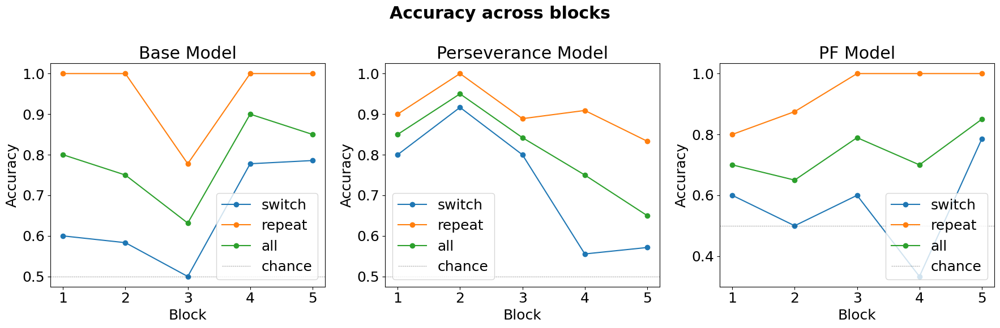

In [ ]:
fig, axs = plt.subplots(1, 3, figsize=(18,6))
axs = axs.ravel()
fig.suptitle('Accuracy across blocks', fontweight='bold')

acc_blocks_base = calculate_accuracy_across_blocks(sim_Base)
plot_accuracy_across_blocks(acc_blocks_base, ax=axs[0])
axs[0].set_title('Base Model')

acc_blocks_P = calculate_accuracy_across_blocks(sim_P)
plot_accuracy_across_blocks(acc_blocks_P, ax=axs[1])
axs[1].set_title('Perseverance Model')

# acc_blocks_F = calculate_accuracy_across_blocks(sim_F)
# plot_accuracy_across_blocks(acc_blocks_F, ax=axs[2])
# axs[2].set_title('Feedback Model')

acc_blocks_PF = calculate_accuracy_across_blocks(sim_PF)
plot_accuracy_across_blocks(acc_blocks_PF, ax=axs[2])
axs[2].set_title('PF Model')

plt.tight_layout()
plt.show()

if SAVE_RESULTS:
    full_file_name = os.path.join(RESULTS_DIR, subDir_modelSimulation, "accuracy_across_blocks.png")
    fig.savefig(full_file_name)
    print(f"Saved to {full_file_name}")

Accuracy after x consecutive repeat trials, on the following repeat and switch

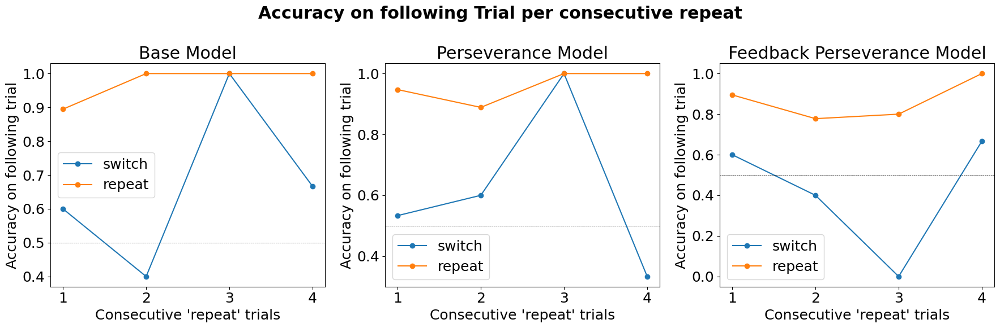

In [ ]:
consecutive_condition = 'repeat'
max_consecutive = 4

fig, axs = plt.subplots(1, 3, figsize=(18,6))
axs = axs.ravel()
fig.suptitle(f'Accuracy on following Trial per consecutive {consecutive_condition}', fontweight='bold')


on_condition = 'switch'
acc_consecutive_base = calculate_accuracy_consecutive_condition(sim_Base, consecutive_condition, on_condition, max_consecutive)
plot_accuracy_consecutive_condition(acc_consecutive_base, consecutive_condition, on_condition=on_condition, ax=axs[0])
axs[0].set_title('Base Model')

acc_consecutive_P = calculate_accuracy_consecutive_condition(sim_P, consecutive_condition, on_condition, max_consecutive)
plot_accuracy_consecutive_condition(acc_consecutive_P, consecutive_condition, on_condition=on_condition, ax=axs[1])
axs[1].set_title('Perseverance Model')

# acc_consecutive_F = calculate_accuracy_consecutive_condition(sim_F, consecutive_condition, on_condition, max_consecutive)
# plot_accuracy_consecutive_condition(acc_consecutive_F, consecutive_condition, on_condition=on_condition, ax=axs[2])
# axs[2].set_title('Feedback Model')

acc_consecutive_PF = calculate_accuracy_consecutive_condition(sim_PF, consecutive_condition, on_condition, max_consecutive)
plot_accuracy_consecutive_condition(acc_consecutive_PF, consecutive_condition, on_condition=on_condition, ax=axs[2])
axs[2].set_title('Feedback Perseverance Model')


on_condition = 'repeat'
acc_consecutive_base = calculate_accuracy_consecutive_condition(sim_Base, consecutive_condition, on_condition, max_consecutive)
plot_accuracy_consecutive_condition(acc_consecutive_base, consecutive_condition, on_condition=on_condition, ax=axs[0])
axs[0].set_title('Base Model')
axs[0].legend()

acc_consecutive_P = calculate_accuracy_consecutive_condition(sim_P, consecutive_condition, on_condition, max_consecutive)
plot_accuracy_consecutive_condition(acc_consecutive_P, consecutive_condition, on_condition=on_condition, ax=axs[1])
axs[1].set_title('Perseverance Model')
axs[1].legend()
# acc_consecutive_F = calculate_accuracy_consecutive_condition(sim_F, consecutive_condition, on_condition, max_consecutive)
# plot_accuracy_consecutive_condition(acc_consecutive_F, consecutive_condition, on_condition=on_condition, ax=axs[2])
# axs[2].set_title('Feedback Model')

acc_consecutive_PF = calculate_accuracy_consecutive_condition(sim_PF, consecutive_condition, on_condition, max_consecutive)
plot_accuracy_consecutive_condition(acc_consecutive_PF, consecutive_condition, on_condition=on_condition, ax=axs[2])
axs[2].set_title('Feedback Perseverance Model')
axs[2].legend()

plt.tight_layout()
plt.show()

if SAVE_RESULTS:
    full_file_name = os.path.join(RESULTS_DIR, subDir_modelSimulation, "accuracy_consecutive_condition.png")
    fig.savefig(full_file_name)
    print(f"Saved to {full_file_name}")

## Parameter Fitting *(4 points)*

For this exercise you should:

*   Set up a suitable parameter search space *(1 point)*

*   Implement a procedure to evaluate the fit of a model based on data *(2 points)*

*   Implement a procedure for searching the parameter space. *(1 point)*

Make sure to comment your code and provide an explanation for each code block in a preceding text block.



### Parameter fitting procedure and implemented fit measure and search method
- We use the **log likelihood** (****LL****) as a fit measure of the parameters of a model to the provided data.
  - computed from the propabilities of the taken a model taking the taken the same choice as the provided data.
- we use simple grid search over the parameter space to find the best fitting parameters for the models based on the maximum log likelihood.

Procedure of parameter fitting:  
for a given model:
- given experiment data (either real or surrogate)
- for each parameter combination in the parameter space:
  - compute the log likelihood of the model with the given parameters to the data
    - simulate the model with the given parameters on the same trial sequence as the data
    - compute the probabilities of the model taking the same choices as in the data
    - compute the log likelihood over those probabilities 
- pick the parameter combination with the highest log likelihood as the best fitting parameters

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from parameter_fitting import param_fit_grid_search, param_fit_grid_search_parallel, plot_heatmap
from model_simulation import simulate_experiment, generate_experiment_trials, generate_experiment_trials_fromData
from analysis import *

subDir_paramFitting = "parameter_fitting"

### Fitting the models to either surregate or participant data

In [30]:
# Parameter Fitting
num_samples = 8
fit_on_participant = True # whether to fit the models on participants data or on the simulated data

np.random.seed(SEED)
# search space over parameters
min_g, max_g = 0, 5
min_c, max_c = -2, 2
min_alpha, max_alpha = 0.0, 1.0
min_gamma, max_gamma = -1, 1

# experiment parameters
num_trials = 100

# setting model parameters
# hyperparameters
T = 2
sigma = 0.2
tau_P = 2/T
x_0 = np.array([0.5, 0.5, 0])

# free parameters
true_g = 3
true_c = -0.2
true_alpha = 0.1
true_gamma = 0.4

g_values = np.linspace(min_g, max_g, num_samples)
c_values = np.linspace(min_c, max_c, num_samples)
alpha_values = np.linspace(min_alpha, max_alpha, num_samples)
gamma_values = np.linspace(min_gamma, max_gamma, num_samples)

# print search space
print("g_values:", g_values)
print("c_values:", c_values)
print("alpha_values:", alpha_values)
print("gamma_values:", gamma_values)

if fit_on_participant:
    # load the participant data
    data_cleaned = pd.read_csv(cleaned_file_name)
    df_base = data_cleaned.copy()
    df_P = data_cleaned.copy()
    # df_F = data_cleaned.copy()
    df_PF = data_cleaned.copy()

else: # generate surregate data from all models
    experiment_trials = generate_experiment_trials(num_trials) # generate trial sequence for the experiment
    # obtain surrogate data by simulating the model with the set parameters
    df_base = simulate_experiment(num_trials, T, x_0, true_g, true_c, 0, 0, sigma, tau_P, task_sequence = experiment_trials)
    df_P = simulate_experiment(num_trials, T, x_0, true_g, true_c, 0, true_gamma, sigma, tau_P, task_sequence = experiment_trials)
    # df_F = simulate_experiment(num_trials, T, x_0, true_g, true_c, true_alpha, 0, sigma, tau_P, task_sequence = experiment_trials)
    df_PF = simulate_experiment(num_trials, T, x_0, true_g, true_c, true_alpha, true_gamma, sigma, tau_P, task_sequence = experiment_trials)

g_values: [0.         0.71428571 1.42857143 2.14285714 2.85714286 3.57142857
 4.28571429 5.        ]
c_values: [-2.         -1.42857143 -0.85714286 -0.28571429  0.28571429  0.85714286
  1.42857143  2.        ]
alpha_values: [0.         0.14285714 0.28571429 0.42857143 0.57142857 0.71428571
 0.85714286 1.        ]
gamma_values: [-1.         -0.71428571 -0.42857143 -0.14285714  0.14285714  0.42857143
  0.71428571  1.        ]


Run the cell below to fit on a participant data instead of the surrogate data generated above.

run parameter fitting on all models

In [31]:
# base model
best_params_base, best_LL_base, LL_matrix_base = param_fit_grid_search_parallel(df_base, T, x_0, g_values, c_values, np.zeros(1), np.zeros(1), sigma, tau_P)
best_g_base, best_c_base, best_alpha_base, best_gamma_base = best_params_base

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

In [32]:
# perseverence model
best_params_P, best_LL_P, LL_matrix_P = param_fit_grid_search_parallel(df_P, T, x_0, g_values, c_values, np.zeros(1), gamma_values, sigma, tau_P)
best_g_P, best_c_P, best_alpha_P, best_gamma_P = best_params_P

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

In [33]:
# # feedback model
# best_params_F, best_LL_F, LL_matrix_F = param_fit_grid_search_parallel(df_F, T, x_0, g_values, c_values, alpha_values, np.zeros(1), sigma, tau_P)
# best_g_F, best_c_F, best_alpha_F, best_gamma_F = best_params_F                          

In [34]:
# PF model
best_params_PF, best_LL_PF, LL_matrix_PF = param_fit_grid_search_parallel(df_PF, T, x_0, g_values, c_values, alpha_values, gamma_values, sigma, tau_P)
best_g_PF, best_c_PF, best_alpha_PF, best_gamma_PF = best_params_PF

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

In [35]:
if fit_on_participant:
    print("Fitting on participant data")
else:
    print("true_g:", true_g)
    print("true_c:", true_c)
    print("true_alpha:", true_alpha)
    print("true_gamma:", true_gamma)

Fitting on participant data


In [36]:
# make a df of the best fitted params and LL
# best_params_all = [best_params_base, best_params_P, best_params_F, best_params_PF]
# best_params_all = [best_params_base, best_params_P, best_params_F, best_params_PF]
model_names = ['base', 'perseverance', 'PF']
best_params_all = [best_params_base, best_params_P, best_params_PF]

# best_LLs = [best_LL_base, best_LL_P, best_LL_F, best_LL_PF]
best_LLs = [best_LL_base, best_LL_P, best_LL_PF]

param_fitting_results = pd.DataFrame(columns=['best_g', 'best_c', 'best_alpha', 'best_gamma', 'best_LL'], index=model_names)

for model, bets_param, LL in zip(model_names, best_params_all, best_LLs):
    param_fitting_results.loc[model] = [*bets_param, LL]

param_fitting_results = param_fitting_results.astype(float).round(3)

display(param_fitting_results)

,best_g,best_c,best_alpha,best_gamma,best_LL
base,1.429,-0.286,0.000,0.000,-61.863
perseverance,1.429,-0.286,0.000,0.714,-61.615
PF,1.429,0.286,0.571,-1.000,-47.700


,best_g,best_c,best_alpha,best_gamma,best_LL
base,1.429,-0.286,0.0,0.0,-61.863


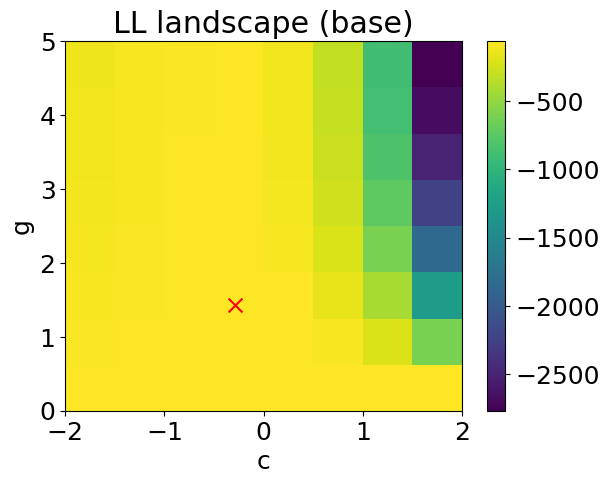

Saved to results/LL_landscape_base.png


In [ ]:
# base model
display(param_fitting_results.loc['base'].to_frame().T)

ax = plot_heatmap(LL_matrix_base[:,:,0,0], c_values, g_values, 'c', 'g', f'LL landscape (base)')
ax.scatter(best_c_base, best_g_base, color='r', s=100 , marker='x')
plt.show()
if SAVE_RESULTS:
    full_file_name = os.path.join(RESULTS_DIR, subDir_paramFitting,'LL_landscape_base.png')
    ax.figure.savefig(full_file_name)
    print(f"Saved to {full_file_name}")

In [38]:
# Fix indices for best parameters (for slicing the 4D LL_matrix_P)
g_idx_fixed = np.argmin(np.abs(g_values - best_g_PF))
c_idx_fixed = np.argmin(np.abs(c_values - best_c_PF))
alpha_idx_fixed = np.argmin(np.abs(alpha_values - best_alpha_PF))
gamma_idx_fixed = np.argmin(np.abs(gamma_values - best_gamma_PF))

,best_g,best_c,best_alpha,best_gamma,best_LL
perseverance,1.429,-0.286,0.0,0.714,-61.615


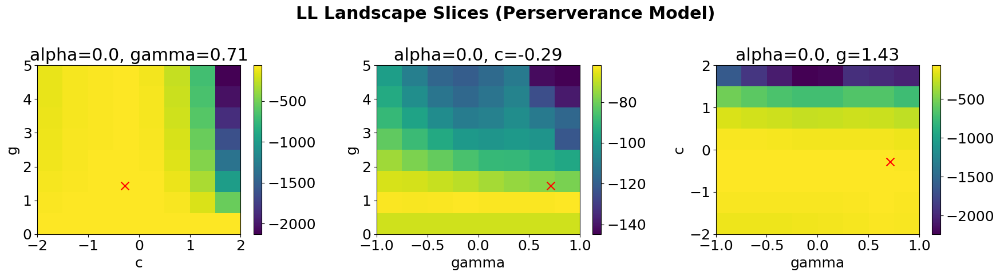

Saved to results/LL_landscape_P.png


In [ ]:
# perseverence model
display(param_fitting_results.loc['perseverance'].to_frame().T)

fig, axs = plt.subplots(1, 3, figsize=(18, 5))
fig.subplots_adjust(hspace=0.5, wspace=0.5)
fig.suptitle('LL Landscape Slices (Perserverance Model)', fontweight='bold')
axs = axs.ravel()

# fix alpha gamma, vary g c
plot_heatmap(LL_matrix_P[:, :, 0, gamma_idx_fixed],
             c_values, g_values, 'c', 'g',
             title=f'alpha={np.round(best_alpha_P, 2)}, gamma={np.round(best_gamma_P, 2)}',
             ax=axs[0])
axs[0].scatter(best_c_P, best_g_P, color='red', s=100, marker='x')

# fix alpha c, vary g and gamma
plot_heatmap(LL_matrix_P[:, c_idx_fixed, 0, :],
             gamma_values, g_values, 'gamma', 'g',
             title=f'alpha={np.round(best_alpha_P, 2)}, c={np.round(best_c_P, 2)}',
             ax=axs[1])
axs[1].scatter(best_gamma_P, best_g_P, color='red', s=100, marker='x')

# fix g alpha, vary c and gamma
plot_heatmap(LL_matrix_P[c_idx_fixed, :, 0, :],
             gamma_values, c_values, 'gamma', 'c',
             title=f'alpha={np.round(best_alpha_P, 2)}, g={np.round(best_g_P, 2)}',
             ax=axs[2])
axs[2].scatter(best_gamma_P, best_c_P, color='red', s=100, marker='x')


plt.tight_layout()
plt.show()
if SAVE_RESULTS:
    full_file_name = os.path.join(RESULTS_DIR, subDir_paramFitting,'LL_landscape_P.png')
    fig.savefig(full_file_name)
    print(f"Saved to {full_file_name}")

In [ ]:
# # feedback model
# display(param_fitting_results.loc['feedback'].to_frame().T)

# fig, axs = plt.subplots(1, 3, figsize=(18, 5))
# fig.subplots_adjust(hspace=0.5, wspace=0.5)
# fig.suptitle('LL Landscape Slices (Feedback Model)', fontweight='bold')
# axs = axs.ravel()

# # fix alpha gamma, vary g c
# plot_heatmap(LL_matrix_F[:, :, alpha_idx_fixed, 0],
#              c_values, g_values, 'c', 'g',
#              title=f'alpha={np.round(best_alpha_F, 2)}, gamma={np.round(best_gamma_F, 2)}',
#              ax=axs[0])
# axs[0].scatter(best_c_F, best_g_F, color='red', s=100, marker='x')

# # fix alpha c, vary g and gamma
# plot_heatmap(LL_matrix_F[:, c_idx_fixed, alpha_idx_fixed, :],
#              gamma_values, g_values, 'gamma', 'g',
#              title=f'alpha={np.round(best_alpha_F, 2)}, c={np.round(best_c_F, 2)}',
#              ax=axs[1])
# axs[1].scatter(best_gamma_F, best_g_F, color='red', s=100, marker='x')

# # fix g alpha, vary c and gamma
# plot_heatmap(LL_matrix_F[c_idx_fixed, :, alpha_idx_fixed, :],
#              gamma_values, c_values, 'gamma', 'c',
#              title=f'alpha={np.round(best_alpha_F, 2)}, g={np.round(best_g_F, 2)}',
#              ax=axs[2])
# axs[2].scatter(best_gamma_F, best_c_F, color='red', s=100, marker='x')

# plt.tight_layout()
# plt.show()

# if SAVE_RESULTS:
#     full_file_name = os.path.join(RESULTS_DIR, subDir_paramFitting,'LL_landscape_F.png')
#     fig.savefig(full_file_name)
#     print(f"Saved to {full_file_name}")

,best_g,best_c,best_alpha,best_gamma,best_LL
PF,1.429,0.286,0.571,-1.0,-47.7


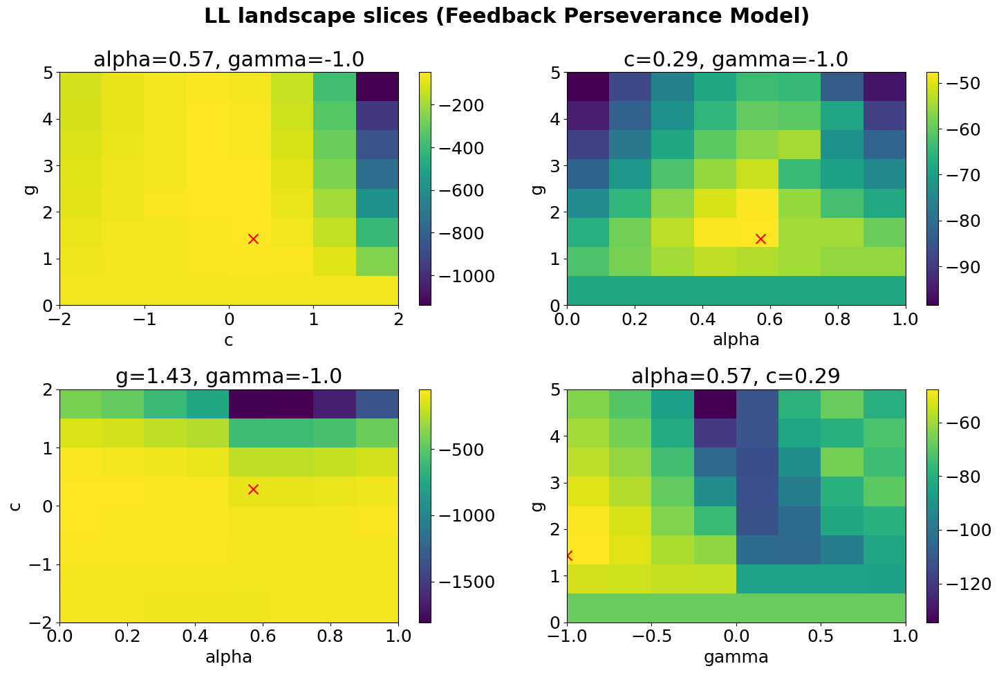

Saved to results/LL_landscape_PF.png


In [ ]:
# Feedback Perseverance model
display(param_fitting_results.loc['PF'].to_frame().T)

fig, axs = plt.subplots(2, 2, figsize=(15, 10))
fig.subplots_adjust(hspace=0.5, wspace=0.5)
fig.suptitle('LL landscape slices (Feedback Perseverance Model)', fontweight='bold')
axs = axs.ravel()

# fix alpha gamma, vary c g
plot_heatmap(LL_matrix_PF[:, :, alpha_idx_fixed, gamma_idx_fixed], 
             c_values, g_values, 'c', 'g', 
             title=f'alpha={np.round(best_alpha_PF, 2)}, gamma={np.round(best_gamma_PF, 2)}',
             ax=axs[0])
axs[0].scatter(best_c_PF, best_g_PF, color='red', s=100, marker='x')

# fix c gamma, vary g alpha
plot_heatmap(LL_matrix_PF[:, c_idx_fixed, :, gamma_idx_fixed], 
             alpha_values, g_values, 'alpha', 'g', 
             title=f'c={np.round(best_c_PF, 2)}, gamma={np.round(best_gamma_PF, 2)}',
             ax=axs[1])
axs[1].scatter(best_alpha_PF, best_g_PF, color='red', s=100, marker='x')

# fix g gamma, vary c, alpha
plot_heatmap(LL_matrix_PF[g_idx_fixed, :, alpha_idx_fixed, :], 
             alpha_values, c_values, 'alpha', 'c', 
             title=f'g={np.round(best_g_PF, 2)}, gamma={np.round(best_gamma_PF, 2)}',
             ax=axs[2])
axs[2].scatter(best_alpha_PF, best_c_PF, color='red', s=100, marker='x')

# fix c alpha, vary g, gamma
plot_heatmap(LL_matrix_PF[:, c_idx_fixed, alpha_idx_fixed, :], 
             gamma_values, g_values, 'gamma', 'g', 
             title=f'alpha={np.round(best_alpha_PF, 2)}, c={np.round(best_c_PF, 2)}',
             ax=axs[3])
axs[3].scatter(best_gamma_PF, best_g_PF, color='red', s=100, marker='x')

plt.tight_layout()
plt.show()
if SAVE_RESULTS:
    full_file_name = os.path.join(RESULTS_DIR, subDir_paramFitting,'LL_landscape_PF.png')
    fig.savefig(full_file_name)
    print(f"Saved to {full_file_name}")

### brief inspection of the fitted models as a sanity check 

,best_g,best_c,best_alpha,best_gamma,best_LL
base,1.429,-0.286,0.0,0.0,-61.863


Ploting first 20 trials:


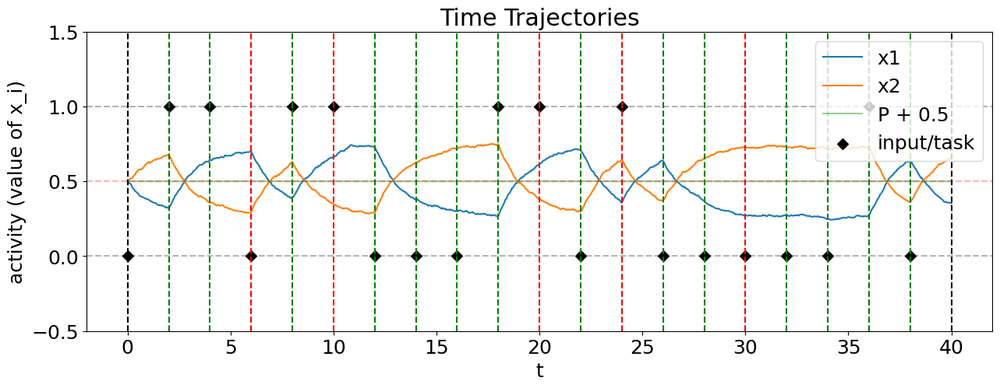

,best_g,best_c,best_alpha,best_gamma,best_LL
perseverance,1.429,-0.286,0.0,0.714,-61.615


Ploting first 20 trials:


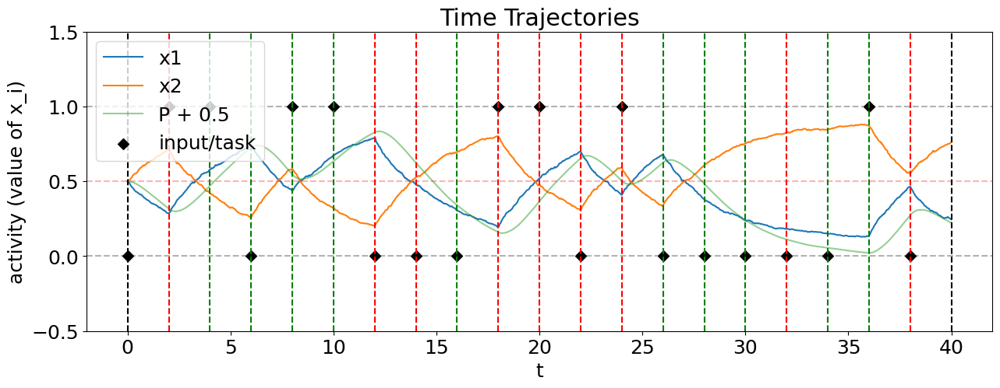

,best_g,best_c,best_alpha,best_gamma,best_LL
PF,1.429,0.286,0.571,-1.0,-47.7


Ploting first 20 trials:


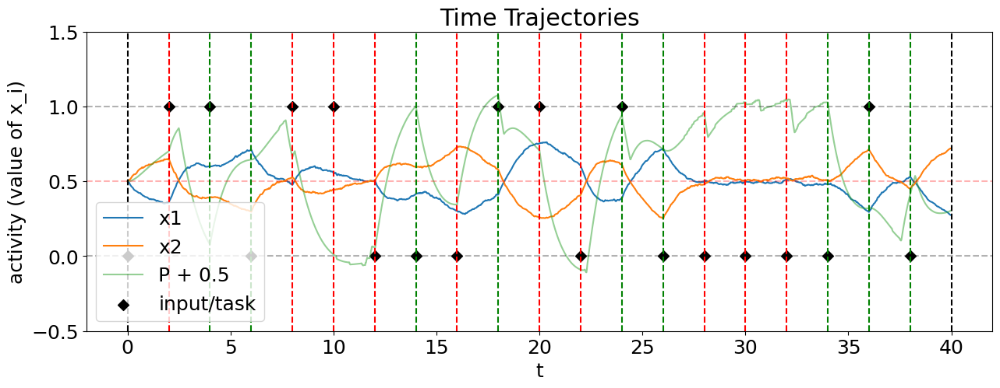

<Figure size 640x480 with 0 Axes>

In [42]:
# simulating a small sample of trials to get an insight into the dynamics of fitted models
experiment_trials = generate_experiment_trials(num_trials) # randome sequence of tasks
experiment_trials = generate_experiment_trials_fromData(data_cleaned) # or same sequence as the fitting data

# Base Model
np.random.seed(SEED)
display(param_fitting_results.loc['base'].to_frame().T)
data_Base = simulate_experiment(num_trials, T, x_0, best_g_base, best_c_base, best_alpha_base, best_gamma_base, sigma, tau_P, bool_plot_trajectory = True, task_sequence = experiment_trials)

# Perseverence Model
np.random.seed(SEED)
display(param_fitting_results.loc['perseverance'].to_frame().T)
data_P = simulate_experiment(num_trials, T, x_0, best_g_P, best_c_P, best_alpha_P, best_gamma_P, sigma, tau_P, bool_plot_trajectory = True, task_sequence = experiment_trials)
# Feedback Model
# np.random.SEED(SEED)
# display(param_fitting_results.loc['feedback'].to_frame().T)
# data_F = simulate_experiment(num_trials, T, x_0, best_g_F, best_c_F, best_alpha_F, best_gamma_F, sigma, tau_P, bool_plot_trajectory = True, task_sequence = experiment_trials)

# # Feedback Perseverance Model
np.random.seed(SEED)
display(param_fitting_results.loc['PF'].to_frame().T)
data_PF = simulate_experiment(num_trials, T, x_0, best_g_PF, best_c_PF, best_alpha_PF, best_gamma_PF, sigma, tau_P, bool_plot_trajectory = True, task_sequence = experiment_trials)

accuracy participant:  0.673469387755102
accuracy base:  0.711340206185567
accuracy perserverance:  0.6701030927835051
accuracy perserverance feedback:  0.7319587628865979


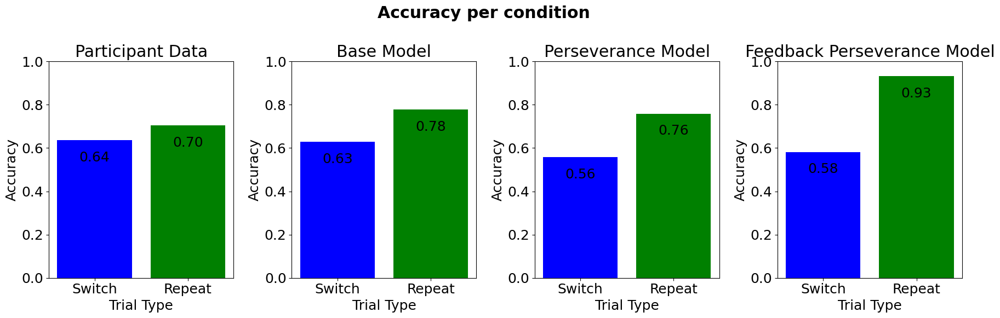

In [ ]:
# plot accuary over trails for both models

include_reference = 0
if fit_on_participant:
    include_reference = 1
    print('accuracy participant: ', data_cleaned.iloc[-1]['accuracy'])
    fig, axs = plt.subplots(1, 4, figsize=(18, 6))
    axs = axs.ravel()
    acc_cond_ref_data = calculate_accuracy_condition(data_cleaned)
    plot_accuracy_condition(acc_cond_ref_data, ax=axs[0])
    axs[0].set_title('Participant Data')
else:
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))
    axs = axs.ravel()

print('accuracy base: ', data_Base.iloc[-1]['accuracy'])
print('accuracy perserverance: ', data_P.iloc[-1]['accuracy'])
print('accuracy perserverance feedback: ', data_PF.iloc[-1]['accuracy'])

fig.suptitle('Accuracy per condition', fontweight='bold')

acc_cond_base = calculate_accuracy_condition(data_Base)
plot_accuracy_condition(acc_cond_base, ax=axs[0 + include_reference])
axs[0 + include_reference].set_title('Base Model')

acc_cond_P = calculate_accuracy_condition(data_P)
plot_accuracy_condition(acc_cond_P, ax=axs[1 + include_reference])
axs[1 + include_reference].set_title('Perseverance Model')

# acc_cond_F = calculate_accuracy_condition(data_F)
# plot_accuracy_condition(acc_cond_F, ax=axs[2])
# axs[2].set_title('Feedback Model')

# acc_cond_PF = calculate_accuracy_condition(data_PF)
plot_accuracy_condition(acc_cond_PF, ax=axs[2 + include_reference])
axs[2+ include_reference].set_title('Feedback Perseverance Model')



plt.tight_layout()
plt.show()

if SAVE_RESULTS:
    full_file_name = os.path.join(RESULTS_DIR, subDir_paramFitting,'accuracy_per_condition.png')
    fig.savefig(full_file_name)
    print(f"Saved to {full_file_name}")

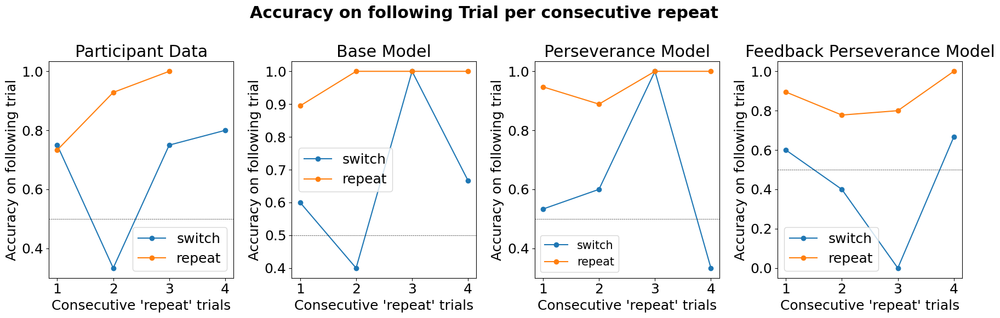

In [ ]:
consecutive_condition = 'repeat'
max_consecutive = 4

include_reference = 0
if fit_on_participant:
    include_reference = 1
    fig, axs = plt.subplots(1, 4, figsize=(18, 6))
    axs = axs.ravel()
    acc_consecutive_ref_data = calculate_accuracy_consecutive_condition(data_cleaned, consecutive_condition, 'switch', max_consecutive)
    plot_accuracy_consecutive_condition(acc_consecutive_ref_data, consecutive_condition, on_condition='switch', ax=axs[0])
    acc_consecutive_ref_data = calculate_accuracy_consecutive_condition(data_cleaned, consecutive_condition, 'repeat', max_consecutive)
    plot_accuracy_consecutive_condition(acc_consecutive_ref_data, consecutive_condition, on_condition='repeat', ax=axs[0])
    axs[0].set_title('Participant Data')
    axs[0].legend()
else:
    fig, axs = plt.subplots(1, 3, figsize=(18,6))
    axs = axs.ravel()

fig.suptitle(f'Accuracy on following Trial per consecutive {consecutive_condition}', fontweight='bold')


on_condition = 'switch'
acc_consecutive_base = calculate_accuracy_consecutive_condition(sim_Base, consecutive_condition, on_condition, max_consecutive)
plot_accuracy_consecutive_condition(acc_consecutive_base, consecutive_condition, on_condition=on_condition, ax=axs[0 + include_reference])
axs[0 + include_reference].set_title('Base Model')

acc_consecutive_P = calculate_accuracy_consecutive_condition(sim_P, consecutive_condition, on_condition, max_consecutive)
plot_accuracy_consecutive_condition(acc_consecutive_P, consecutive_condition, on_condition=on_condition, ax=axs[1 + include_reference])
axs[1 + include_reference].set_title('Perseverance Model')

# acc_consecutive_F = calculate_accuracy_consecutive_condition(sim_F, consecutive_condition, on_condition, max_consecutive)
# plot_accuracy_consecutive_condition(acc_consecutive_F, consecutive_condition, on_condition=on_condition, ax=axs[2 + include_reference])
# axs[2 + include_reference].set_title('Feedback Model')

acc_consecutive_PF = calculate_accuracy_consecutive_condition(sim_PF, consecutive_condition, on_condition, max_consecutive)
plot_accuracy_consecutive_condition(acc_consecutive_PF, consecutive_condition, on_condition=on_condition, ax=axs[2 + include_reference])
axs[2 + include_reference].set_title('PF Model')


on_condition = 'repeat'
acc_consecutive_base = calculate_accuracy_consecutive_condition(sim_Base, consecutive_condition, on_condition, max_consecutive)
plot_accuracy_consecutive_condition(acc_consecutive_base, consecutive_condition, on_condition=on_condition, ax=axs[0 + include_reference])
axs[0 + include_reference].set_title('Base Model')
axs[0 + include_reference].legend()

acc_consecutive_P = calculate_accuracy_consecutive_condition(sim_P, consecutive_condition, on_condition, max_consecutive)
plot_accuracy_consecutive_condition(acc_consecutive_P, consecutive_condition, on_condition=on_condition, ax=axs[1 + include_reference])
axs[1 + include_reference].set_title('Perseverance Model')
axs[1 + include_reference].legend(fontsize=15)

# acc_consecutive_F = calculate_accuracy_consecutive_condition(sim_F, consecutive_condition, on_condition, max_consecutive)
# plot_accuracy_consecutive_condition(acc_consecutive_F, consecutive_condition, on_condition=on_condition, ax=axs[2 + include_reference])
# axs[2 + include_reference].set_title('Feedback Model')

acc_consecutive_PF = calculate_accuracy_consecutive_condition(sim_PF, consecutive_condition, on_condition, max_consecutive)
plot_accuracy_consecutive_condition(acc_consecutive_PF, consecutive_condition, on_condition=on_condition, ax=axs[2 + include_reference])
axs[2 + include_reference].set_title('Feedback Perseverance Model')
axs[2 + include_reference].legend()

plt.tight_layout()
plt.show()

if SAVE_RESULTS:
    full_file_name = os.path.join(RESULTS_DIR, subDir_paramFitting,'accuracy_consecutive_condition.png')
    fig.savefig(full_file_name)
    print(f"Saved to {full_file_name}")

## Parameter Recovery *(5 points)*

For this exercise you should:

*   Set up a suitable space of parameters relevant for parameter recovery *(1 point)*

*   Use the functions above to generate behavior from a models, for a given set of (randomly sampled) parameters, and then fit the model to its generated data. Make sure to evaluate the parameter fit in a quantiative manner. *(3 points)*

*   Plot the parameter recovery results for both models. *(1 point)*

Make sure to comment your code and provide an explanation for each code block in a preceding text block.





### Parameter Recovery search space and procedure

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from parameter_recovery import param_recovery, summarize_paramRecovery_results, plot_true_fitted_correlation, plot_cross_correlation

subDir_paramRecovery = "parameter_recovery"

In [ ]:
# Parameter Recovery
# Number of true values we seek to simulate and num of search values for fitting
num_true_param_set = 20
num_samples = 8

np.random.seed(SEED)
# Experiment parameters
num_trials = 100
T = 2
sigma = 0.2
tau_P = T/2
x_0 = np.array([0.5, 0.5, 0])

# Range of simulated and tested values for c, g, alpha, gamma
min_g, max_g = 0, 5
min_c, max_c = -2, 2
min_alpha, max_alpha = 0.0, 1.0
min_gamma, max_gamma = -1, 1

# Determine range of parameters for fitting
g_values = np.linspace(min_g, max_g, num_samples)
c_values = np.linspace(min_c, max_c, num_samples)
alpha_values = np.linspace(min_alpha, max_alpha, num_samples)
gamma_values = np.linspace(min_gamma, max_gamma, num_samples)

# param sets/combinations to recover
to_recover_g = np.random.uniform(min_g, max_g, num_true_param_set)
to_recover_c = np.random.uniform(min_c, max_c, num_true_param_set)
to_recover_alpha = np.random.uniform(min_alpha, max_alpha, num_true_param_set)
to_recover_gamma = np.random.uniform(min_gamma, max_gamma, num_true_param_set)

### run parameter recovery on the models

In [47]:
# base model
fitted_g_log_base, fitted_c_log_base, fitted_alpha_log_base, fitted_gamma_log_base, LL_log_base = param_recovery(num_trials, T, x_0,
                                                                        to_recover_g, to_recover_c, np.zeros(num_true_param_set), np.zeros(num_true_param_set),
                                                                        g_values, c_values, np.zeros(1), np.zeros(1), sigma, tau_P)

run:   0%|          | 0/20 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

In [48]:
# perseverence model
fitted_g_log_P, fitted_c_log_P, fitted_alpha_log_P, fitted_gamma_log_P, LL_log_P = param_recovery(num_trials, T, x_0,
                                                                        to_recover_g, to_recover_c, np.zeros(num_true_param_set), to_recover_gamma,
                                                                        g_values, c_values, np.zeros(1), gamma_values, sigma, tau_P)

run:   0%|          | 0/20 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

In [49]:
# # feedback model
# fitted_g_log_F, fitted_c_log_F, fitted_alpha_log_F, fitted_gamma_log_F, LL_log_F = param_recovery(num_trials, T, x_0,
#                                                                         to_recover_g, to_recover_c, to_recover_alpha, np.zeros(num_true_param_set),
#                                                                         g_values, c_values, alpha_values, np.zeros(1), sigma, tau_P)

In [50]:
# PF model
fitted_g_log_PF, fitted_c_log_PF, fitted_alpha_log_PF, fitted_gamma_log_PF, LL_log_PF = param_recovery(num_trials, T, x_0,
                                                                        to_recover_g, to_recover_c, to_recover_alpha, to_recover_gamma,
                                                                        g_values, c_values, alpha_values, gamma_values, sigma, tau_P)

run:   0%|          | 0/20 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

### Summarize the results of the parameter recovery
calculate the inter- and cross- parameter correlations within each model and put them into a tables for better interpretation and later plotting.
- **inter-correlation** of parameters: how **true** and **recovered/fitted** values of the **same** parameter correlate.
- **cross-correlation** of parameters: how **recoverd/fitted** values of **different** parameters within each model correlate.

In [51]:
param_names = ['g', 'c', 'alpha', 'gamma']

# summarize the results
# base
results_base, inter_corr_base, cross_corr_base = summarize_paramRecovery_results(param_names, to_recover_g, to_recover_c, np.zeros(num_true_param_set), np.zeros(num_true_param_set),
                                                                                    fitted_g_log_base, fitted_c_log_base, fitted_alpha_log_base, fitted_gamma_log_base, LL_log_base)
# perseverence
results_P, inter_corr_P, cross_corr_P = summarize_paramRecovery_results(param_names, to_recover_g, to_recover_c, np.zeros(num_true_param_set), to_recover_gamma,
                                                                                    fitted_g_log_P, fitted_c_log_P, fitted_alpha_log_P, fitted_gamma_log_P, LL_log_P)
# feedback
# results_F, inter_corr_F, cross_corr_F = summarize_paramRecovery_results(param_names, to_recover_g, to_recover_c, to_recover_alpha, np.zeros(num_true_param_set),
#                                                                                     fitted_g_log_F, fitted_c_log_F, fitted_alpha_log_F, fitted_gamma_log_F, LL_log_F)
# Feedback Perseverance
results_PF, inter_corr_PF, cross_corr_PF = summarize_paramRecovery_results(param_names, to_recover_g, to_recover_c, to_recover_alpha, to_recover_gamma,
                                                                                    fitted_g_log_PF, fitted_c_log_PF, fitted_alpha_log_PF, fitted_gamma_log_PF, LL_log_PF)
          
# print the results
print('Base Model:')
display(results_base)
display(inter_corr_base)
display(cross_corr_base)
print('-'*50)
print('Perseverance Model:')
display(results_P)
display(inter_corr_P)
display(cross_corr_P)
print('-'*50)
# print('Feedback Model:')
# display(results_F)
# display(inter_corr_F)
# display(cross_corr_F)
# print('-'*50)
print('Feedback Perseverance Model:')
display(results_PF)
display(inter_corr_PF)
display(cross_corr_PF)

Base Model:


/home/mj/Documents/Esma/MiCNS/DynamicalSystemsModelling_TS/parameter_recovery.py:140: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr_true_fitted = [pearsonr(results_df[f"true_{param}"], results_df[f"fitted_{param}"]) for param in param_names]
/home/mj/Documents/Esma/MiCNS/DynamicalSystemsModelling_TS/parameter_recovery.py:150: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  method=lambda x, y: pearsonr(x, y)[0]
/home/mj/Documents/Esma/MiCNS/DynamicalSystemsModelling_TS/parameter_recovery.py:140: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr_true_fitted = [pearsonr(results_df[f"true_{param}"], results_df[f"fitted_{param}"]) for param in param_names]
/home/mj/Documents/Esma/MiCNS/DynamicalSystemsModelling_TS/parameter_recovery.py:150: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  meth

,true_g,true_c,true_alpha,true_gamma,fitted_g,fitted_c,fitted_alpha,fitted_gamma,LL
0,3.482346,0.537604,0.0,0.0,5.000000,0.857143,0.0,0.0,-3.297946
1,1.430697,1.397727,0.0,0.0,5.000000,2.000000,0.0,0.0,-6.770327
2,1.134257,0.897821,0.0,0.0,2.142857,0.285714,0.0,0.0,-30.547652
3,2.756574,0.444094,0.0,0.0,4.285714,0.285714,0.0,0.0,-16.422778
4,3.597345,0.889774,0.0,0.0,5.000000,0.857143,0.0,0.0,-7.382190
5,2.115532,-0.708164,0.0,0.0,3.571429,-0.857143,0.0,0.0,-57.238181
6,4.903821,-0.552845,0.0,0.0,4.285714,-0.857143,0.0,0.0,-53.710459
7,3.424149,-1.086947,0.0,0.0,2.857143,-1.428571,0.0,0.0,-60.509510
8,2.404660,-0.825144,0.0,0.0,2.142857,-0.857143,0.0,0.0,-63.135536
9,1.960588,0.523904,0.0,0.0,2.857143,0.285714,0.0,0.0,-26.450831


,correlation,p-value
parameter,,
g,0.534,1.54e-02
c,0.834,4.80e-06
alpha,NaN,nan
gamma,NaN,nan


,fitted_g,fitted_c,fitted_alpha,fitted_gamma
fitted_g,1.000000,0.363062,NaN,NaN
fitted_c,0.363062,1.000000,NaN,NaN
fitted_alpha,NaN,NaN,1.0,NaN
fitted_gamma,NaN,NaN,NaN,1.0


--------------------------------------------------
Perseverance Model:


,true_g,true_c,true_alpha,true_gamma,fitted_g,fitted_c,fitted_alpha,fitted_gamma,LL
0,3.482346,0.537604,0.0,0.338628,2.142857,0.857143,0.0,0.428571,-21.517089
1,1.430697,1.397727,0.0,0.171873,0.714286,2.000000,0.0,0.714286,-14.225385
2,1.134257,0.897821,0.0,0.249807,0.714286,1.428571,0.0,1.000000,-27.142356
3,2.756574,0.444094,0.0,0.349378,2.857143,0.285714,0.0,0.428571,-25.173159
4,3.597345,0.889774,0.0,0.684685,2.142857,0.285714,0.0,1.000000,-18.779898
5,2.115532,-0.708164,0.0,-0.833610,4.285714,-0.857143,0.0,0.428571,-60.151327
6,4.903821,-0.552845,0.0,0.527366,5.000000,-0.857143,0.0,0.428571,-57.728214
7,3.424149,-1.086947,0.0,-0.512667,2.857143,-2.000000,0.0,0.428571,-61.557905
8,2.404660,-0.825144,0.0,-0.611554,2.142857,-0.857143,0.0,0.428571,-58.214300
9,1.960588,0.523904,0.0,0.144914,5.000000,0.285714,0.0,-0.714286,-20.554286


,correlation,p-value
parameter,,
g,0.573,8.21e-03
c,0.958,3.61e-11
alpha,NaN,nan
gamma,0.214,3.65e-01


,fitted_g,fitted_c,fitted_alpha,fitted_gamma
fitted_g,1.000000,-0.134322,NaN,-0.332197
fitted_c,-0.134322,1.000000,NaN,0.042805
fitted_alpha,NaN,NaN,1.0,NaN
fitted_gamma,-0.332197,0.042805,NaN,1.000000


--------------------------------------------------
Feedback Perseverance Model:


,true_g,true_c,true_alpha,true_gamma,fitted_g,fitted_c,fitted_alpha,fitted_gamma,LL
0,3.482346,0.537604,0.623953,0.338628,5.000000,0.857143,0.571429,-1.000000,-4.272522
1,1.430697,1.397727,0.115618,0.171873,4.285714,0.857143,0.571429,-1.000000,-7.370913
2,1.134257,0.897821,0.317285,0.249807,2.142857,0.857143,0.571429,-1.000000,-16.819635
3,2.756574,0.444094,0.414826,0.349378,3.571429,0.285714,0.428571,-1.000000,-19.677161
4,3.597345,0.889774,0.866309,0.684685,2.857143,0.857143,0.428571,-1.000000,-11.795543
5,2.115532,-0.708164,0.250455,-0.833610,2.142857,-0.285714,0.571429,-1.000000,-55.161919
6,4.903821,-0.552845,0.483034,0.527366,3.571429,-0.285714,0.571429,-1.000000,-48.728169
7,3.424149,-1.086947,0.985560,-0.512667,5.000000,-0.285714,0.714286,0.714286,-50.863678
8,2.404660,-0.825144,0.519485,-0.611554,3.571429,-0.285714,0.714286,-1.000000,-46.206464
9,1.960588,0.523904,0.612895,0.144914,3.571429,0.285714,0.571429,-1.000000,-26.974104


,correlation,p-value
parameter,,
g,0.089,7.09e-01
c,0.804,1.98e-05
alpha,0.147,5.38e-01
gamma,-0.593,5.85e-03


,fitted_g,fitted_c,fitted_alpha,fitted_gamma
fitted_g,1.000000,-0.064120,0.518058,0.699379
fitted_c,-0.064120,1.000000,-0.464140,-0.309426
fitted_alpha,0.518058,-0.464140,1.000000,0.666667
fitted_gamma,0.699379,-0.309426,0.666667,1.000000


### plot results of parameter recovery
#### inter-correlation
##### Base Model

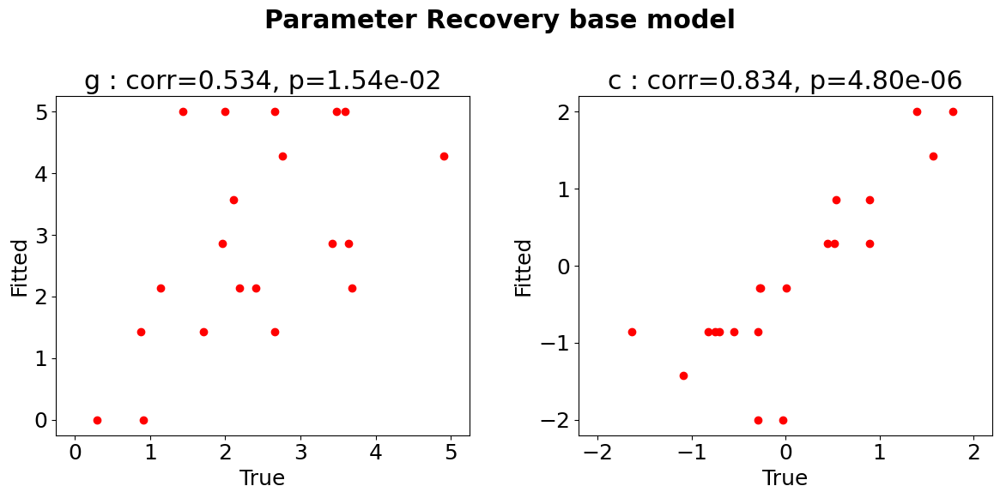

Saved to results/true_fitted_corr_base.png


In [ ]:
# plot the true to fitted parameters correlation for base model
fig, axs = plt.subplots(1, 2, figsize=(12, 6))  # Adjust the figsize as needed
axs = axs.ravel()
fig.suptitle('Parameter Recovery base model', fontweight='bold')

# set some margine to better see edge points
margin = 0.05

plot_true_fitted_correlation(to_recover_g, fitted_g_log_base, g_values, margin, axs[0])
axs[0].set_title(f'g : corr={inter_corr_base.loc["g", "correlation"]}, p={inter_corr_base.loc["g", "p-value"]}')

plot_true_fitted_correlation(to_recover_c, fitted_c_log_base, c_values, margin, axs[1])
axs[1].set_title(f'c : corr={inter_corr_base.loc["c", "correlation"]}, p={inter_corr_base.loc["c", "p-value"]}')

plt.tight_layout()
plt.show()
if SAVE_RESULTS:
    full_file_name = os.path.join(RESULTS_DIR, subDir_paramRecovery,'true_fitted_correlation_base.png')
    fig.savefig(full_file_name)
    print(f"Saved to {full_file_name}")

##### Perseverance Model

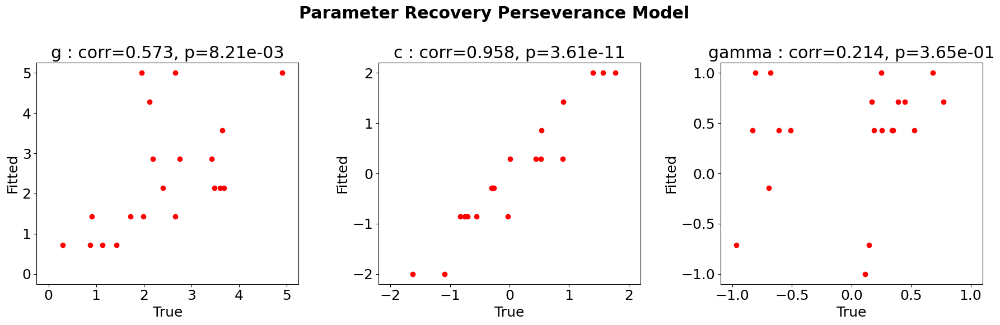

Saved to results/true_fitted_corr_P.png


In [ ]:
# plot the true to fitted parameters correlation for perseverence model
fig, axs = plt.subplots(1, 3, figsize=(18, 6))  # Adjust the figsize as needed
axs = axs.ravel()
fig.suptitle('Parameter Recovery Perseverance Model', fontweight='bold')

# set some margine to better see edge points
margin = 0.05

plot_true_fitted_correlation(to_recover_g, fitted_g_log_P, g_values, margin, axs[0])
axs[0].set_title(f'g : corr={inter_corr_P.loc["g", "correlation"]}, p={inter_corr_P.loc["g", "p-value"]}')

plot_true_fitted_correlation(to_recover_c, fitted_c_log_P, c_values, margin, axs[1])
axs[1].set_title(f'c : corr={inter_corr_P.loc["c", "correlation"]}, p={inter_corr_P.loc["c", "p-value"]}')

plot_true_fitted_correlation(to_recover_gamma, fitted_gamma_log_P, gamma_values, margin, axs[2])
axs[2].set_title(f'gamma : corr={inter_corr_P.loc["gamma", "correlation"]}, p={inter_corr_P.loc["gamma", "p-value"]}')

plt.tight_layout()
plt.show()
if SAVE_RESULTS:
    full_file_name = os.path.join(RESULTS_DIR, subDir_paramRecovery,'true_fitted_correlation_P.png')
    fig.savefig(full_file_name)
    print(f"Saved to {full_file_name}")

<!-- ##### Feedback Model -->

In [ ]:
# # plot the true to fitted parameters correlation for feedback model
# fig, axs = plt.subplots(1, 3, figsize=(18, 6))  # Adjust the figsize as needed
# axs = axs.ravel()
# fig.suptitle('Parameter Recovery Feedback Model', fontweight='bold')

# # set some margine to better see edge points
# margin = 0.05

# plot_true_fitted_correlation(to_recover_g, fitted_g_log_F, g_values, margin, axs[0])
# axs[0].set_title(f'g : corr={inter_corr_F.loc["g", "correlation"]}, p={inter_corr_F.loc["g", "p-value"]}')

# plot_true_fitted_correlation(to_recover_c, fitted_c_log_F, c_values, margin, axs[1])
# axs[1].set_title(f'c : corr={inter_corr_F.loc["c", "correlation"]}, p={inter_corr_F.loc["c", "p-value"]}')

# plot_true_fitted_correlation(to_recover_alpha, fitted_alpha_log_F, alpha_values, margin, axs[2])
# axs[2].set_title(f'alpha : corr={inter_corr_F.loc["alpha", "correlation"]}, p={inter_corr_F.loc["alpha", "p-value"]}')


# plt.tight_layout()
# plt.show()
# if SAVE_RESULTS:
#     full_file_name = os.path.join(RESULTS_DIR, subDir_paramRecovery,'true_fitted_correlation_F.png')
#     fig.savefig(full_file_name)
#     print(f"Saved to {full_file_name}")

##### Feedback Perseverance Model

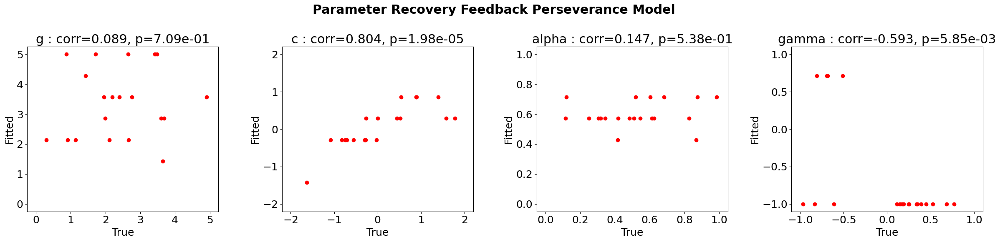

Saved to results/true_fitted_corr_PF.png


In [ ]:
# plot the true to fitted parameters correlation for PF model
fig, axs = plt.subplots(1, 4, figsize=(24, 6))  # Adjust the figsize as needed
axs = axs.ravel()
fig.suptitle('Parameter Recovery Feedback Perseverance Model', fontweight='bold')

# set some margine to better see edge points
margin = 0.05

plot_true_fitted_correlation(to_recover_g, fitted_g_log_PF, g_values, margin, axs[0])
axs[0].set_title(f'g : corr={inter_corr_PF.loc["g", "correlation"]}, p={inter_corr_PF.loc["g", "p-value"]}')

plot_true_fitted_correlation(to_recover_c, fitted_c_log_PF, c_values, margin, axs[1])
axs[1].set_title(f'c : corr={inter_corr_PF.loc["c", "correlation"]}, p={inter_corr_PF.loc["c", "p-value"]}')

plot_true_fitted_correlation(to_recover_alpha, fitted_alpha_log_PF, alpha_values, margin, axs[2])
axs[2].set_title(f'alpha : corr={inter_corr_PF.loc["alpha", "correlation"]}, p={inter_corr_PF.loc["alpha", "p-value"]}')

plot_true_fitted_correlation(to_recover_gamma, fitted_gamma_log_PF, gamma_values, margin, axs[3])
axs[3].set_title(f'gamma : corr={inter_corr_PF.loc["gamma", "correlation"]}, p={inter_corr_PF.loc["gamma", "p-value"]}')

plt.tight_layout()
plt.show()

if SAVE_RESULTS:
    full_file_name = os.path.join(RESULTS_DIR, subDir_paramRecovery,'true_fitted_correlation_PF.png')
    fig.savefig(full_file_name)
    print(f"Saved to {full_file_name}")

#### cross-correlation of all models

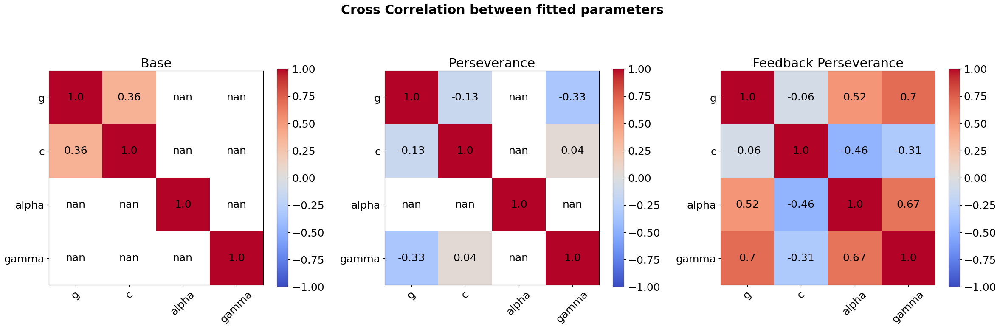

Saved to results/cross_corr.png


In [ ]:
# plot cross correlation between the fitted parameters for both models
fig, axs = plt.subplots(1, 3, figsize=(24, 8))  # Adjust the figsize as needed
axs = axs.ravel()
fig.suptitle('Cross Correlation between fitted parameters', fontweight='bold')

# base model
plot_cross_correlation(cross_corr_base, param_names, ax=axs[0])
axs[0].set_title('Base')

# perseverence model
plot_cross_correlation(cross_corr_P, param_names, ax=axs[1])
axs[1].set_title('Perseverance')

# # feedback model
# plot_cross_correlation(cross_corr_F, param_names, ax=axs[2])
# axs[2].set_title('Feedback')

# perseverence feedback model
plot_cross_correlation(cross_corr_PF, param_names, ax=axs[2])
axs[2].set_title('Feedback Perseverance')

plt.tight_layout()
plt.show()
if SAVE_RESULTS:
    full_file_name = os.path.join(RESULTS_DIR, subDir_paramRecovery,'cross_correlation.png')
    fig.savefig(full_file_name)
    print(f"Saved to {full_file_name}")

## *Optional*: Model Recovery *(2 bonus points)*

In this bonus exercise, you may examine model reovery. The bonus points count towards your total group project points. That is, you may accumlate up to 22 points in the practical part of the group project.

Make sure to comment your code and provide an explanation for each code block in a preceding text block.





### model recovery procedure

- generate **equal** number of data sets from **each** model
- fit all models to all data sets
- evaluate the best fitting model for each data set in terms of **BIC**
- calculate the **confusion and inversion matrices** between the true and best fitting models of the data sets

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from model_recovery import model_recovery, plot_model_recovery

subDir_modelRecovery = "model_recovery"

In [58]:
# Model Recovery
np.random.seed(SEED)
# Number of true values we seek to simulate and num of search values
num_runs = 10 # number of generated data sets from each model
num_samples = 8 # number of search values for fitting

# pick which models to include for the model recovery
model_names = ['base', 'perseverance', 'PF'] # the names of the models to include in the model recovery

num_models = len(model_names)
num_true_parameters_samples = num_runs * num_models # number of total true parameter sets to the models combined
# Experiment parameters
num_trials = 100
# hyperparameters
T = 2
sigma = 0.2
tau_P = 2/T
x_0 = np.array([0.5, 0.5, 0])

# Range of simulated and tested values for c, g, alpha, gamma
min_g, max_g = 0, 5
min_c, max_c = -2, 2
min_alpha, max_alpha = 0.0, 1.0
min_gamma, max_gamma = -1, 1

# Determine range of parameters for fitting
g_values = np.linspace(min_g, max_g, num_samples)
c_values = np.linspace(min_c, max_c, num_samples)
alpha_values = np.linspace(min_alpha, max_alpha, num_samples)
gamma_values = np.linspace(min_gamma, max_gamma, num_samples)

# sampled parameters sets/combinations for the models
# first num_runs are for the base model, next num_runs for the perseverance model, and last num_runs for the feedback perseverance model
# each parameter set is the i_th entry from each parameters array
# the first num_runs entries of each array belong to the i_th model as listed in model_names
# example: first parameter set of the base model is (sampled_g[0], sampled_c[0], sampled_alpha[0], sampled_gamma[0])

sampled_g = np.random.uniform(min_g, max_g, num_models*num_runs)
sampled_c = np.random.uniform(min_c, max_c, num_models*num_runs)
sampled_alpha = np.random.uniform(min_alpha, max_alpha, num_models*num_runs)
sampled_gamma = np.random.uniform(min_gamma, max_gamma, num_models*num_runs)

sampled_alpha[:2*num_runs] = 0  # set alpha to 0 for the base and perseverance model
sampled_gamma[:num_runs] = 0    # set gamma to 0 for the base model

print("number of total model fitting runs: ", num_true_parameters_samples)
print("number of total parameter fitting runs: ", num_true_parameters_samples*num_models)

number of total model fitting runs:  30
number of total parameter fitting runs:  90


In [59]:
confusion_matrix, inverse_matrix, true_fitted_df = model_recovery(num_trials, T, x_0, sampled_g, sampled_c, sampled_alpha, sampled_gamma,
                                                    g_values, c_values, alpha_values, gamma_values, sigma, tau_P, model_names=model_names)

run:   0%|          | 0/10 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

/home/mj/Documents/Esma/MiCNS/DynamicalSystemsModelling_TS/model_recovery.py:121: RuntimeWarning: invalid value encountered in divide
  inverse_matrix = best_fit_matrix / np.sum(best_fit_matrix, axis=1, keepdims=True)


In [ ]:
# display(true_fitted_df)
if SAVE_RESULTS:
    full_file_name = os.path.join(RESULTS_DIR, subDir_modelRecovery,'true_fitted_models.csv')
    true_fitted_df.to_csv(full_file_name, index=False)
    print(f"Saved to {full_file_name}")
    # save the confusion matrix
    full_file_name = os.path.join(RESULTS_DIR, subDir_modelRecovery,'confusion_matrix.csv')
    confusion_matrix.to_csv(full_file_name)
    print(f"Saved to {full_file_name}")

Saved to results/model_recovery_results.csv


### Results of the model recovery
#### plotting the confusion and inversion matrices of the model recovery

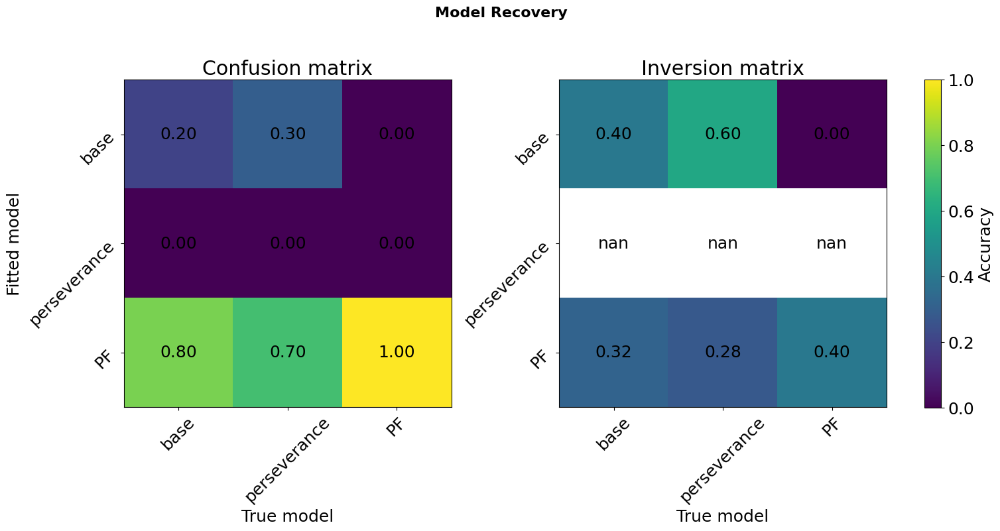

Saved to results/model_recovery.png


In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 8), constrained_layout=True)
axs = axs.ravel()
fig.suptitle('Model Recovery', fontsize=16, y=1.0, fontweight='bold')
plot_model_recovery(confusion_matrix, inverse_matrix, model_names, axs=axs)

# plt.subplots_adjust()
plt.show()

if SAVE_RESULTS:
    full_file_name = os.path.join(RESULTS_DIR, subDir_modelRecovery,'model_recovery.png')
    fig.savefig(full_file_name)
    print(f"Saved to {full_file_name}")

## Model Comparison *(5 points)*

For this exercise you should:

*   Load and (potentially) preprocess the experimental data. (1 point)

*   Fit the two models to the data.  *(1 point)*

*   Evaluate which model performs better, taking into account fit and model complexity. *(2 points)*

*   Plot the behavior of the winning model against the data. *(1 point)**

Make sure to comment your code and provide an explanation for each code block in a preceding text block.





In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
import json
import random
from tqdm.notebook import tqdm

from model_comparison import model_fit, model_comparision_results_statistics
from data_cleaning import clean_data
from analysis import *
from model_simulation import simulate_experiment, generate_experiment_trials, generate_experiment_trials_fromData
import model


SAVE_RESULTS = True
RESULTS_DIR = "results"
RAW_DATA_DIR = "data" 
CLEANED_DATA_DIR = "data_cleaned"

subDir_modelComparison = "model_comparison"

SEED = 123

# make sure the data and results directories exist
os.makedirs(os.path.join(RESULTS_DIR, subDir_modelComparison), exist_ok=True)
os.makedirs(os.path.join(RAW_DATA_DIR), exist_ok=True)
os.makedirs(os.path.join(CLEANED_DATA_DIR), exist_ok=True)

### Load and clean all participants data

load the raw data files and proccess them to the cleaned format

In [2]:
reset_cleaned_data = False # set to True to delete all cleaned in cleaned_data_dir and re-process the raw data

raw_data_dir = RAW_DATA_DIR
cleaned_data_dir = CLEANED_DATA_DIR

# check if both directories exist, create them if they don't
os.makedirs(raw_data_dir, exist_ok=True)
os.makedirs(cleaned_data_dir, exist_ok=True)

if reset_cleaned_data:
    # remove all files in the cleaned_data_dir ending with .csv
    files = glob.glob(os.path.join(cleaned_data_dir, '*.csv'))
    for f in files:
        os.remove(f)

# check the number of .jsin files in the raw_data_dir and .csv files in the cleaned_data_dir
raw_data_names = glob.glob(os.path.join(raw_data_dir, '*.json'))
cleaned_data_names = glob.glob(os.path.join(cleaned_data_dir, '*.csv'))

num_raw_data_files = len(raw_data_names)
num_cleaned_data_files = len(cleaned_data_names)

print(f'number of raw data files: {num_raw_data_files}')
print(f'number of cleaned data files: {num_cleaned_data_files}')

# list of data files that are in the raw data directory but not in the cleaned data directory
data_files_to_clean = [file for file in raw_data_names if os.path.basename(file).replace('.json', '.csv') not in cleaned_data_names]
# print("data to clean: ", *data_files_to_clean, sep='\n')
# clean raw data files
for data_file in data_files_to_clean:
    with open(data_file, "r") as f:
        data = json.load(f)
    # save to csv only if the data is not already saved
    if not os.path.exists(os.path.join(cleaned_data_dir, os.path.basename(data_file).replace('.json', '.csv'))):
        df_raw = pd.json_normalize(data)
        df_clean = clean_data(df_raw) 
        df_clean.to_csv(os.path.join(cleaned_data_dir, os.path.basename(data_file).replace('.json', '.csv')), index=False)

# get the names of the cleaned data files again after possible upadting
cleaned_data_names = glob.glob(os.path.join(cleaned_data_dir, '*.csv'))
print(f'updated number of cleaned data files: {len(cleaned_data_names)}')
print("file names: ", *cleaned_data_names, sep='\n')
# load the cleaned data into dataframes
data_dfs = [pd.read_csv(data_file) for data_file in cleaned_data_names]

if len(data_dfs) == 0:
    raise ValueError(f"No data to fit files found. Please upload raw data files to: {cleaned_data_dir}, or cleaned data to: {cleaned_data_dir}")

number of raw data files: 17
number of cleaned data files: 17
updated number of cleaned data files: 17
file names: 
data_cleaned/example Alex3.csv
data_cleaned/example-1.csv
data_cleaned/example_dn.csv
data_cleaned/Yehore data.csv
data_cleaned/example Alex2.csv
data_cleaned/example_s.csv
data_cleaned/MaybeLudo.csv
data_cleaned/example Val.csv
data_cleaned/Hendrik Data.csv
data_cleaned/example_eg.csv
data_cleaned/AnyonesGuessButMaybeSammy.csv
data_cleaned/example.csv
data_cleaned/example Alex4.csv
data_cleaned/Sophie.csv
data_cleaned/example andr.csv
data_cleaned/example Alex1.csv
data_cleaned/Esma.csv


### Fit the models and compute model fit metrics

- fit all models to each participant data
- for model fit measure, we use the **BIC** as a trade-off between model fit and model complexity

In [3]:
# Parameter Fitting Setup
num_samples = 8

random.seed(SEED)

# Experiment parameters
num_trials = 100
# hyperparameters
T = 2
sigma = 0.2
tau_P = 2/T
x_0 = [0.5, 0.5, 0]

# Search space over parameters
min_g, max_g = 0, 5
min_c, max_c = -2, 2
min_alpha, max_alpha = 0.0, 1.0
min_gamma, max_gamma = -1, 1

c_values = np.linspace(min_c, max_c, num_samples)
g_values = np.linspace(min_g, max_g, num_samples)
alpha_values = np.linspace(min_alpha, max_alpha, num_samples)
gamma_values = np.linspace(min_gamma, max_gamma, num_samples)

# Initialize counters for the best fit model
model_names = ['base', 'perseverance', 'PF']
best_model_fit_counts = {model: 0 for model in model_names}

In [4]:
# Initialize a dictionary to store the best-fitting parameters for each participant
verbose = False
participant_results = {}

# Loop through all data (each participant's data)
print(f"Fitting models ({model_names}) to ({len(data_dfs)}) participants data...")
for idx, data in tqdm(enumerate(data_dfs), total=len(data_dfs), desc='participants', leave=True):
    results_ = model_fit(data, T, x_0, g_values, c_values, alpha_values, gamma_values, sigma, tau_P, model_names)
    
    participant_results[f"participant_{idx + 1}"] = results_

    # determine which model has the lowest BIC for the current participant
    best_model = min(results_, key=lambda x: results_[x]['BIC'])
    best_model_fit_counts[best_model] += 1

    if verbose:
        # Print the results for the current participant
        print(f"Participant {idx + 1} Results:")
        for model, params in results_.items():
            print(f"{model}: {params}")
        print(f"Best Fit Model: {best_model}, BIC: {results_[best_model]['BIC']}")
        # count best fit model sofar
        print(f"Best Fit Counts: {best_model_fit_counts}")

Fitting models (['base', 'perseverance', 'PF']) to (17) participants data...


participants:   0%|          | 0/17 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

### Summarize results of model fitting

In [ ]:
# make a dataframe out of the participant_results
results_df = pd.DataFrame(columns=[f"{model}_{param}" for model in model_names for param in ['g', 'c', 'alpha', 'gamma', 'LL', 'BIC']])
for participant, results_ in participant_results.items():
    results_df.loc[participant] = [results_[model][param] for model in model_names for param in ['g', 'c', 'alpha', 'gamma', 'LL', 'BIC']]

# round the values
results_df = results_df.astype(float).round(3)

# add a column for the name of the best model for each participant
results_df['best_model'] = results_df.apply(lambda x: model_names[np.argmin([x[f"{model}_BIC"] for model in model_names])], axis=1)

# reoder the columns
# results_df = results_df[['best_model', 'base_BIC', 'perseverance_BIC', 'feedback_BIC', 'PF_BIC', 'base_LL', 'perseverance_LL', 'feedback_LL', 'PF_LL',
#                             'base_g', 'base_c', 'base_alpha', 'base_gamma', 
#                             'perseverance_g', 'perseverance_c', 'perseverance_alpha', 'perseverance_gamma',
#                             'feedback_g', 'feedback_c', 'feedback_alpha', 'feedback_gamma',
#                             'PF_g', 'PF_c', 'PF_alpha', 'PF_gamma']]
results_df = results_df[['best_model', 'base_BIC', 'perseverance_BIC', 'PF_BIC', 'base_LL', 'perseverance_LL', 'PF_LL',
                            'base_g', 'base_c', 'base_alpha', 'base_gamma', 
                            'perseverance_g', 'perseverance_c', 'perseverance_alpha', 'perseverance_gamma',
                            'PF_g', 'PF_c', 'PF_alpha', 'PF_gamma']]

# df of of final counts
best_model_fit_counts_df = results_df['best_model'].value_counts().to_frame().T
best_model_fit_counts_df = best_model_fit_counts_df.reindex(columns=model_names, fill_value=0)

display(best_model_fit_counts_df)
display(results_df)

if SAVE_RESULTS:
    full_file_name = os.path.join(RESULTS_DIR, subDir_modelComparison,'model_fit_results.csv')
    results_df.to_csv(full_file_name)
    print(f"Saved to {full_file_name}")

    full_file_name = os.path.join(RESULTS_DIR, subDir_modelComparison,'best_model_fit_counts.csv')
    best_model_fit_counts_df.to_csv(full_file_name)
    print(f"Saved to {full_file_name}")

best_model,base,perseverance,PF
count,1,0,16


,best_model,base_BIC,perseverance_BIC,PF_BIC,base_LL,perseverance_LL,PF_LL,base_g,base_c,base_alpha,base_gamma,perseverance_g,perseverance_c,perseverance_alpha,perseverance_gamma,PF_g,PF_c,PF_alpha,PF_gamma
participant_1,PF,109.324,110.702,93.856,-50.358,-48.895,-38.320,0.714,0.286,0.0,0.0,0.714,0.286,0.0,-0.714,1.429,0.286,0.571,-1.000
participant_2,PF,54.671,56.189,26.640,-22.761,-21.232,-4.170,2.857,0.286,0.0,0.0,3.571,0.286,0.0,0.143,5.000,2.000,1.000,1.000
participant_3,PF,60.190,63.094,56.383,-25.500,-24.655,-19.001,2.857,0.286,0.0,0.0,2.857,0.286,0.0,-0.429,3.571,0.286,0.571,-1.000
participant_4,PF,46.561,51.168,44.932,-18.695,-18.707,-13.296,3.571,0.286,0.0,0.0,4.286,0.286,0.0,-0.143,4.286,0.286,0.857,1.000
participant_5,PF,70.367,76.101,65.458,-30.640,-31.236,-23.642,2.143,0.286,0.0,0.0,2.143,0.286,0.0,-0.143,5.000,0.286,1.000,1.000
participant_6,PF,114.159,116.608,103.370,-52.558,-51.521,-42.641,0.714,0.286,0.0,0.0,0.714,0.286,0.0,0.714,2.143,0.286,0.571,-1.000
participant_7,PF,54.713,53.588,46.254,-22.771,-19.917,-13.957,3.571,0.286,0.0,0.0,3.571,0.286,0.0,-0.714,3.571,0.286,0.571,-1.000
participant_8,base,42.933,46.610,43.082,-16.902,-16.459,-12.412,5.000,0.286,0.0,0.0,5.000,0.286,0.0,-0.429,4.286,0.286,0.571,-1.000
participant_9,PF,74.934,75.013,60.845,-32.934,-30.708,-21.357,2.143,0.286,0.0,0.0,2.143,0.286,0.0,-0.714,2.857,0.286,0.429,-1.000
participant_10,PF,55.525,58.800,52.802,-23.188,-22.538,-17.251,2.857,0.286,0.0,0.0,3.571,0.286,0.0,-0.429,4.286,0.286,0.571,-1.000


Results saved to results/model_fit_results.csv


### Analyse Model Fit Results 

In [6]:
# # load the results_df from RESULTS_DIR
# results_df = pd.read_csv(f'{RESULTS_DIR}/model_fit_results.csv', index_col=0)

# model_names = ['base', 'perseverance', 'PF']
# best_model_fit_counts_df = results_df['best_model'].value_counts().to_frame().T
# best_model_fit_counts_df = best_model_fit_counts_df.reindex(columns=model_names, fill_value=0)
# display(best_model_fit_counts_df)

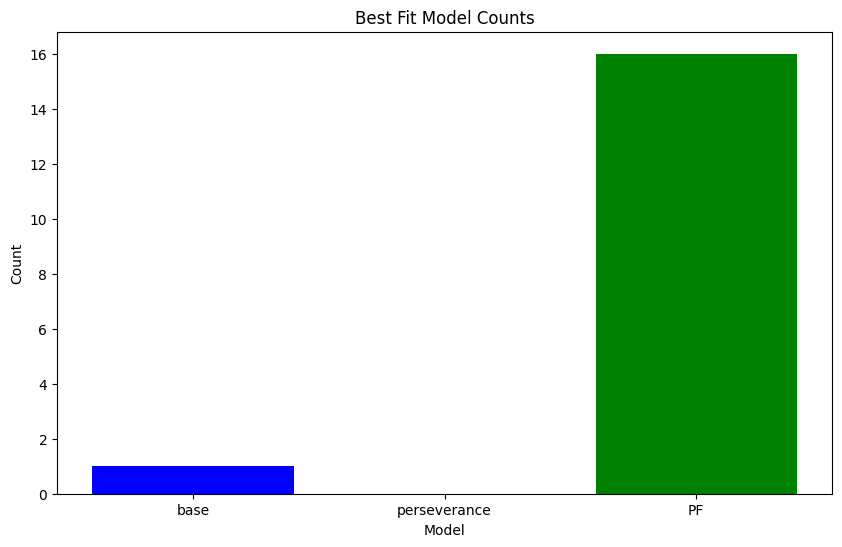

In [7]:
# plot the number of participants for which it was the best fit
fig, ax = plt.subplots(figsize=(10, 6))
# ax.bar(best_model_fit_counts_df.columns, best_model_fit_counts_df.values[0], color=['blue', 'orange', 'green', 'red'], label='Best Fit Model Counts')
ax.bar(best_model_fit_counts_df.columns, best_model_fit_counts_df.values[0], color=['blue', 'orange', 'green'], label='Best Fit Model Counts')
ax.set_title('Best Fit Model Counts')
ax.set_xlabel('Model')
ax.set_ylabel('Count')
plt.show()


In [ ]:
# a dataframe with the statistics of the results, here we keep the statistics of all the models beside the relevant ones to each model
summary_stats_all_df = model_comparision_results_statistics(results_df)

# keep only the best model statistics of each model
cols = ['LL', 'BIC', 'g', 'c', 'alpha', 'gamma']
stats = ['mean', 'std', 'se', 'ci_lower', 'ci_upper']
multi_cols = pd.MultiIndex.from_product([cols, stats])

summary_stats_fit_df = pd.DataFrame(columns=multi_cols, index=model_names)
# the dataframe has one raw for each model and the relevant statistics of that model
for model in model_names:
    if model in summary_stats_all_df.index:
        summary_stats_fit_df.loc[model, 'count'] = summary_stats_all_df.loc[model, ('count')].values[0]
        for stat in stats:
            for col_name in cols:
                summary_stats_fit_df.loc[model, (col_name, stat)] = summary_stats_all_df.loc[model, (f'{model}_{col_name}', stat)]
    else:
        summary_stats_fit_df.loc[model] = np.nan
        summary_stats_fit_df.loc[model, 'count'] = 0


display(summary_stats_all_df)
display(summary_stats_fit_df)

if SAVE_RESULTS:
    full_file_name = os.path.join(RESULTS_DIR, subDir_modelComparison,'summary_stats_all.csv')
    summary_stats_all_df.to_csv(full_file_name)
    print(f"Saved to {full_file_name}")

    full_file_name = os.path.join(RESULTS_DIR, subDir_modelComparison,'summary_stats_fit.csv')
    summary_stats_fit_df.to_csv(full_file_name)
    print(f"Saved to {full_file_name}")

PF_BIC                                    PF_LL                   \
           ci_lower ci_upper    mean     se     std ci_lower ci_upper    mean   
best_model                                                                      
PF           47.375   75.189  61.282  7.096  28.382   -28.51  -14.551 -21.531   
base            NaN      NaN  43.082    NaN     NaN      NaN      NaN -12.412   

                           ... perseverance_g                       \
               se     std  ...       ci_upper   mean     se    std   
best_model                 ...                                       
PF          3.561  14.244  ...          3.641  2.902  0.377  1.509   
base          NaN     NaN  ...            NaN  5.000    NaN    NaN   

           perseverance_gamma                             count  
                     ci_lower ci_upper   mean     se  std        
best_model                                                       
PF                     -0.548   -0.059 -0.304  0.125  0.5    16  
base                      NaN      NaN -0.429    NaN  NaN     1  

[2 rows x 91 columns]

LL                                      BIC                 \
                mean     std     se ci_lower ci_upper    mean     std     se   
base         -16.902     NaN    NaN      NaN      NaN  42.933     NaN    NaN   
perseverance     NaN     NaN    NaN      NaN      NaN     NaN     NaN    NaN   
PF           -21.531  14.244  3.561   -28.51  -14.551  61.282  28.382  7.096   

                                ...  alpha                           gamma  \
             ci_lower ci_upper  ...    std     se ci_lower ci_upper   mean   
base              NaN      NaN  ...    NaN    NaN      NaN      NaN    0.0   
perseverance      NaN      NaN  ...    NaN    NaN      NaN      NaN    NaN   
PF             47.375   75.189  ...  0.186  0.047    0.578    0.761 -0.268   

                                             count  
                std     se ci_lower ci_upper        
base            NaN    NaN      NaN      NaN   1.0  
perseverance    NaN    NaN      NaN      NaN   0.0  
PF            0.978  0.245   -0.747    0.212  16.0  

[3 rows x 31 columns]

Results saved to results/model_comparison_stats_all.csv
Results saved to results/model_comparison_stats_fit.csv


In [ ]:
summary_stats_fit_measures_df = summary_stats_fit_df[['count', 'LL', 'BIC']].copy()
summary_stats_fit_params_df = summary_stats_fit_df[['count', 'g', 'c', 'alpha', 'gamma']].copy()

display(summary_stats_fit_measures_df)
display(summary_stats_fit_params_df)

if SAVE_RESULTS:
    full_file_name = os.path.join(RESULTS_DIR, subDir_modelComparison,'summary_stats_fit_measures.csv')
    summary_stats_fit_measures_df.to_csv(full_file_name)
    print(f"Saved to {full_file_name}")
    # to latex
    full_file_name = os.path.join(RESULTS_DIR, subDir_modelComparison,'summary_stats_fit_measures.tex')
    summary_stats_fit_measures_df.to_latex(full_file_name)
    print(f"Saved to {full_file_name}")

    full_file_name = os.path.join(RESULTS_DIR, subDir_modelComparison,'summary_stats_fit_params.csv')
    summary_stats_fit_params_df.to_csv(full_file_name)
    print(f"Saved to {full_file_name}")
    # to latex
    full_file_name = os.path.join(RESULTS_DIR, subDir_modelComparison,'summary_stats_fit_params.tex')
    summary_stats_fit_params_df.to_latex(full_file_name)
    print(f"Saved to {full_file_name}")

count      LL                                      BIC          \
                      mean     std     se ci_lower ci_upper    mean     std   
base           1.0 -16.902     NaN    NaN      NaN      NaN  42.933     NaN   
perseverance   0.0     NaN     NaN    NaN      NaN      NaN     NaN     NaN   
PF            16.0 -21.531  14.244  3.561   -28.51  -14.551  61.282  28.382   

                                       
                 se ci_lower ci_upper  
base            NaN      NaN      NaN  
perseverance    NaN      NaN      NaN  
PF            7.096   47.375   75.189

count      g                                      c         \
                     mean    std     se ci_lower ci_upper   mean    std   
base           1.0    5.0    NaN    NaN      NaN      NaN  0.286    NaN   
perseverance   0.0    NaN    NaN    NaN      NaN      NaN    NaN    NaN   
PF            16.0  3.661  1.247  0.312     3.05    4.272  0.536  0.589   

                              ...  alpha                                  \
                 se ci_lower  ...   mean    std     se ci_lower ci_upper   
base            NaN      NaN  ...    0.0    NaN    NaN      NaN      NaN   
perseverance    NaN      NaN  ...    NaN    NaN    NaN      NaN      NaN   
PF            0.147    0.247  ...  0.669  0.186  0.047    0.578    0.761   

              gamma                                  
               mean    std     se ci_lower ci_upper  
base            0.0    NaN    NaN      NaN      NaN  
perseverance    NaN    NaN    NaN      NaN      NaN  
PF           -0.268  0.978  0.245   -0.747    0.212  

[3 rows x 21 columns]

Results saved to results/model_comparison_stats_fit_measures.csv
Results saved to results/model_comparison_stats_fit_params.csv
Results saved to results/model_comparison_stats_fit_measures.tex
Results saved to results/model_comparison_stats_fit_params.tex


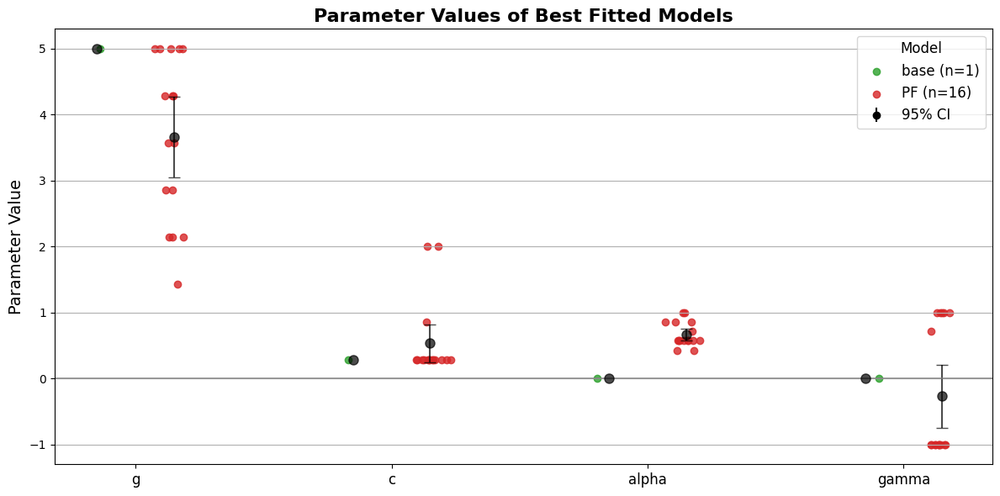

Saved to results/best_fitted_model_params.png


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Filter out models with 0 counts
counts = summary_stats_fit_df['count'].astype(int)  
models = counts[counts > 0].index.tolist()

# Define the parameter columns and extract relevant statistics
param_cols = ['g', 'c', 'alpha', 'gamma']
param_means = summary_stats_fit_df.loc[models, param_cols].xs('mean', axis=1, level=1)
param_ci_lower = summary_stats_fit_df.loc[models, param_cols].xs('ci_lower', axis=1, level=1)
param_ci_upper = summary_stats_fit_df.loc[models, param_cols].xs('ci_upper', axis=1, level=1)
param_errors = (param_ci_upper.values - param_ci_lower.values) / 2
param_errors = pd.DataFrame(param_errors, columns=param_cols, index=models)

# Get all the values of each parameter for each model
param_values = {}
for model in models:
    values_array = results_df.loc[results_df['best_model'] == model, [f"{model}_{param}" for param in param_cols]].values
    param_values[model] = pd.DataFrame(values_array, columns=param_cols)


fig, ax = plt.subplots(figsize=(12, 6))

# Define x positions for each parameter
n_params = len(param_cols)
x_positions = np.arange(n_params)

# Define spacing for models within each parameter
offset = 0.15  # Spacing between models for each parameter
model_positions = np.linspace(-offset, offset, len(models))

# Assign colors for each model
colors = {model: sns.color_palette()[i+2] for i, model in enumerate(models)}

# for each model, scatter plot the parameter values with mean and 95% CI error bars
for i, model in enumerate(models):
    for j, param in enumerate(param_cols):
        # Retrieve parameter values for the model
        values = param_values[model][param].values
        jitter = np.random.normal(loc=0, scale=0.03, size=len(values))  # Jitter for visualization
        
        # Scatter plot with model-specific offset
        ax.scatter(
            np.full_like(values, x_positions[j] + model_positions[i]) + jitter, 
            values, 
            alpha=0.8, 
            label=f"{model} (n={counts[model]})" if j == 0 else "", 
            color=colors[model]
        )

    # Plot mean and CI as error bars
    ax.errorbar(
        x_positions + model_positions[i], 
        param_means.loc[model].values, 
        yerr=param_errors.loc[model].values, 
        fmt='o', 
        color="black", 
        capsize=5, 
        markersize=8,
        alpha=0.7
    )

# horizantal line at y=0
ax.axhline(0, linestyle='-', color='grey', alpha=0.7)

# add xticks and labels
ax.set_xticks(x_positions)
ax.set_xticklabels(param_cols, fontsize=12)
ax.set_ylabel("Parameter Value", fontsize=14)
ax.set_title("Parameter Values of Best Fitted Models", fontsize=16, fontweight='bold')

dummy = ax.errorbar([], [], yerr=0, fmt='o', capsize=5, color='black', label="95% CI")
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, labels, title="Model", fontsize=12, title_fontsize=12)
plt.grid(axis='y')
plt.tight_layout()
plt.show()

if SAVE_RESULTS:
    full_file_name = os.path.join(RESULTS_DIR, subDir_modelComparison,'param_values_bestFit_model.png')
    fig.savefig(full_file_name)
    print(f"Saved to {full_file_name}")


### plot behavior of the winning model against the data

#### average over participants and winning model parameters

In [ ]:
# concatinate all dataframes
max_consecutive_trial_type = 4
# inlcude ID column for each dataframe before merging
for i, data in enumerate(data_dfs):
    data['ID'] = i
data_all = pd.concat(data_dfs, ignore_index=True) # used only for accuracy over blocks as it is not dependent task distribution

# behavior of the best fitted model with mean parameters
# get fitted model with the highest count and its mean parameters
best_model = results_df['best_model'].value_counts().idxmax()
best_model_params = summary_stats_fit_df.loc[best_model, ['g', 'c', 'alpha', 'gamma']].xs('mean', level=1).values
num_fitted_participants = int(summary_stats_fit_df.loc[best_model, 'count'].iloc[0])

num_total_participants = len(data_dfs)

best_model_params = best_model_params.astype(float)
# simulate the fitted model with the mean parameters
num_trials = 100
T = 2
sigma = 0.2
tau_P = 2/T
x_0 = [0.5, 0.5, 0]

# similar to participants analysis, and since the consecutive condition analysis depends on task distribution
# simulated data of the model on the same trial sequence as the participants and concatenate all dataframes
# this will allow for a more robust analysis of the model behavior (cancel out noise on single experiment and task distribution effects)
experiment_trials_same_sequence = [generate_experiment_trials_fromData(data) for data in data_dfs]
data_best_fit_same_trial_sequence = [simulate_experiment(num_trials, T, x_0, *best_model_params, sigma, tau_P, task_sequence=task_sequence) for task_sequence in experiment_trials_same_sequence]
# include ID column for each dataframe before merging
for i, data in enumerate(data_best_fit_same_trial_sequence):
    data['ID'] = i
data_best_fit_all = pd.concat(data_best_fit_same_trial_sequence, ignore_index=True) # used only for accuracy over blocks as it is not dependent task distribution

Best Model: PF, fitted 16 out of 17 participynts (94.11764705882352%)


,g,c,alpha,gamma
mean_best_model,3.661,0.536,0.669,-0.268


/home/mj/Documents/Esma/MiCNS/DynamicalSystemsModelling_TS/analysis.py:83: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  num_blocks: number of blocks to divide the data into
/home/mj/Documents/Esma/MiCNS/DynamicalSystemsModelling_TS/analysis.py:84: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  returns:
/home/mj/Documents/Esma/MiCNS/DynamicalSystemsModelling_TS/analysis.py:83: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
 

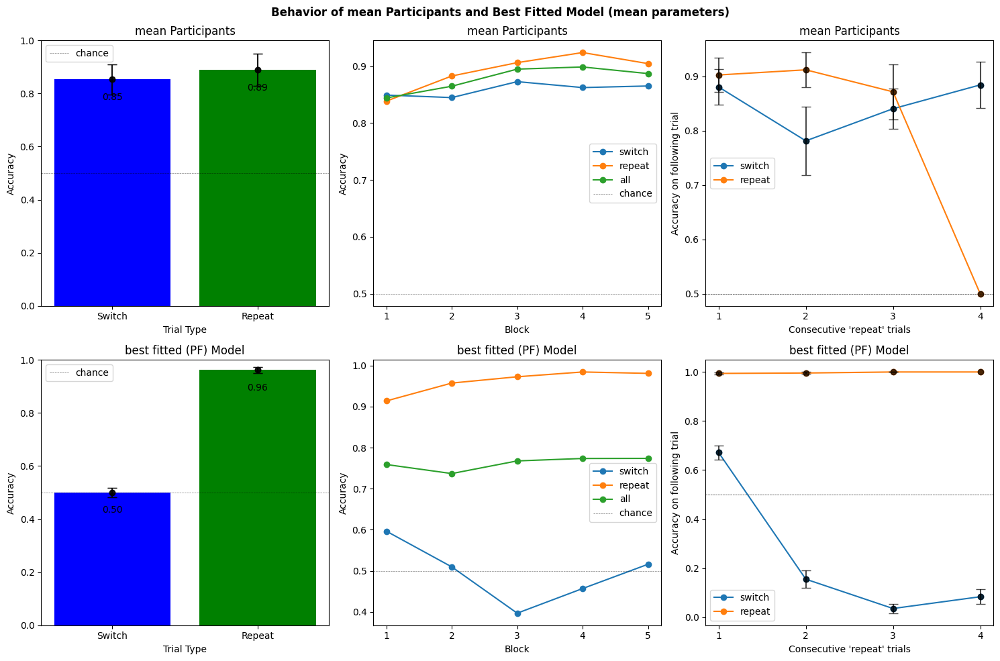

Saved to results/behavioral_comparison_mean_participants_best_fitted_model.png


In [ ]:
print(f"Best Model: {best_model}, fitted {num_fitted_participants} out of {num_total_participants} participynts ({num_fitted_participants/num_total_participants * 100}%)")
display(pd.DataFrame(best_model_params, index=['g', 'c', 'alpha', 'gamma'], columns=['mean_best_model']).T)

# plot results of participants and best fitted model
fig, axs = plt.subplots(2, 3, figsize=(15, 10))
axs = axs.ravel()
fig.suptitle('Behavior of mean Participants and Best Fitted Model (mean parameters)', fontweight='bold')

# mean accuracy per condition over all participants
# calculate std, se and ci bounds for all participants per condition
acc_condition_all = [calculate_accuracy_condition(data) for data in data_dfs] # calculate accuracy per condition for each participant
acc_condition_all_df = pd.DataFrame(acc_condition_all)
acc_condition_summary_df = pd.DataFrame({'mean': acc_condition_all_df.mean(), 
                                         'std': acc_condition_all_df.std(), 
                                         'se': acc_condition_all_df.sem(),
                                        'ci_lower': acc_condition_all_df.mean() - acc_condition_all_df.sem() * 1.96,
                                        'ci_upper': acc_condition_all_df.mean() + acc_condition_all_df.sem() * 1.96,
                                        'count': acc_condition_all_df.count()})
plot_accuracy_condition(acc_condition_summary_df['mean'], ax=axs[0])
axs[0].set_title('mean Participants')
axs[0].axhline(0.5, color="black", linestyle="--", label="chance", alpha=0.5, linewidth=0.5)
# add error bars
axs[0].errorbar(np.arange(len(acc_condition_summary_df['mean'])), acc_condition_summary_df['mean'],
                yerr=acc_condition_summary_df['ci_upper'] - acc_condition_summary_df['mean'], fmt='o', color='black', capsize=5, alpha=0.7)
axs[0].errorbar(np.arange(len(acc_condition_summary_df['mean'])), acc_condition_summary_df['mean'],
                yerr=acc_condition_summary_df['mean'] - acc_condition_summary_df['ci_lower'], fmt='o', color='black', capsize=5, alpha=0.7)
axs[0].legend(fontsize=10)

# mean accuracy across blocks over all participants
acc_blocks = calculate_accuracy_across_blocks(data_all, num_blocks=5)
plot_accuracy_across_blocks(acc_blocks, ax=axs[1])
axs[1].set_title('mean Participants')
axs[1].legend(fontsize=10)

# calculate the accuracy of the consecutive condition for all participants and then calculate the mean accuracy
# this avoid unintended effects on task distribution between multiple experiments
# swith after consecutive repeat trials
acc_consecutive_all = [calculate_accuracy_consecutive_condition(data, 'repeat', 'switch', max_consecutive_trial_type) for data in data_dfs]
acc_consecutive_all_df = pd.concat(acc_consecutive_all, ignore_index=True)
# group by bucket, calculate mean, std, se, ci of accuracy, sum of count
acc_consecutive_summary_df = acc_consecutive_all_df.groupby('bucket').agg({'accuracy': ['mean', 'std', 'sem', 'count'], 'count': 'sum'})
# reshape the df into the original form with mean accuracy and sum of count
acc_consecutive = pd.DataFrame({'accuracy': acc_consecutive_summary_df['accuracy']['mean'], 
                                'count': acc_consecutive_summary_df['count']['sum'], 
                                'bucket': acc_consecutive_summary_df.index})

# repeat after consecutive repeat trials
plot_accuracy_consecutive_condition(acc_consecutive, 'repeat', 'switch', ax=axs[2])
axs[2].errorbar(acc_consecutive['bucket'], acc_consecutive['accuracy'],
                yerr=acc_consecutive_summary_df['accuracy']['sem'], fmt='o', color='black', capsize=5, alpha=0.7)
# same for repeat repeat
acc_consecutive_all = [calculate_accuracy_consecutive_condition(data, 'repeat', 'repeat', max_consecutive_trial_type) for data in data_dfs]
acc_consecutive_all_df = pd.concat(acc_consecutive_all, ignore_index=True)
# group by bucket, calculate mean, std, se, ci of accuracy, sum of count
acc_consecutive_summary_df = acc_consecutive_all_df.groupby('bucket').agg({'accuracy': ['mean', 'std', 'sem', 'count'], 'count': 'sum'})
# reshape the df into the original form with mean accuracy and sum of count
acc_consecutive = pd.DataFrame({'accuracy': acc_consecutive_summary_df['accuracy']['mean'], 
                                'count': acc_consecutive_summary_df['count']['sum'], 
                                'bucket': acc_consecutive_summary_df.index})
# plot the mean accuracy of the consecutive condition
plot_accuracy_consecutive_condition(acc_consecutive, 'repeat', 'repeat', ax=axs[2])
# include the IC of the mean accuracy
axs[2].errorbar(acc_consecutive['bucket'], acc_consecutive['accuracy'],
                yerr=acc_consecutive_summary_df['accuracy']['sem'], fmt='o', color='black', capsize=5, alpha=0.7)
axs[2].set_title('mean Participants')
axs[2].legend(fontsize=10)



# same plots for the best fitted model
# mean accuracy per condition over multiple simulations of the best fitted model
model_acc_condition_all = [calculate_accuracy_condition(surrogate_data) for surrogate_data in data_best_fit_same_trial_sequence] # calculate accuracy per condition for each participant
model_acc_condition_all_df = pd.DataFrame(model_acc_condition_all)
model_acc_condition_summary_df = pd.DataFrame({'mean': model_acc_condition_all_df.mean(), 
                                         'std': model_acc_condition_all_df.std(), 
                                         'se': model_acc_condition_all_df.sem(),
                                        'ci_lower': model_acc_condition_all_df.mean() - model_acc_condition_all_df.sem() * 1.96,
                                        'ci_upper': model_acc_condition_all_df.mean() + model_acc_condition_all_df.sem() * 1.96,
                                        'count': model_acc_condition_all_df.count()})

plot_accuracy_condition(model_acc_condition_summary_df['mean'], ax=axs[3])
axs[3].set_title(f'best fitted ({best_model}) Model')
axs[3].axhline(0.5, color="black", linestyle="--", label="chance", alpha=0.5, linewidth=0.5)
# add error bars
axs[3].errorbar(np.arange(len(model_acc_condition_summary_df['mean'])), model_acc_condition_summary_df['mean'],
                yerr=model_acc_condition_summary_df['ci_upper'] - model_acc_condition_summary_df['mean'], fmt='o', color='black', capsize=5, alpha=0.7)
axs[3].errorbar(np.arange(len(model_acc_condition_summary_df['mean'])), model_acc_condition_summary_df['mean'],
                yerr=model_acc_condition_summary_df['mean'] - model_acc_condition_summary_df['ci_lower'], fmt='o', color='black', capsize=5, alpha=0.7)
axs[3].legend(fontsize=10)

# mean accuracy across blocks over multiple simulations of the best fitted model
model_acc_blocks = calculate_accuracy_across_blocks(data_best_fit_all, num_blocks=5)
plot_accuracy_across_blocks(model_acc_blocks, ax=axs[4])
axs[4].set_title(f'best fitted ({best_model}) Model')
axs[4].legend(fontsize=10)

# mean accuracy of the consecutive condition over multiple simulations of the best fitted model
# swith after consecutive repeat trials
model_acc_consecutive_all = [calculate_accuracy_consecutive_condition(data, 'repeat', 'switch', max_consecutive_trial_type) for data in data_best_fit_same_trial_sequence]
model_acc_consecutive_all_df = pd.concat(model_acc_consecutive_all, ignore_index=True)
# group by bucket, calculate mean, std, se, ci of accuracy, sum of count
model_acc_consecutive_summary_df = model_acc_consecutive_all_df.groupby('bucket').agg({'accuracy': ['mean', 'std', 'sem', 'count'], 'count': 'sum'})
# reshape the df into the original form with mean accuracy and sum of count
model_acc_consecutive = pd.DataFrame({'accuracy': model_acc_consecutive_summary_df['accuracy']['mean'], 
                                'count': model_acc_consecutive_summary_df['count']['sum'], 
                                'bucket': model_acc_consecutive_summary_df.index})
# plot the mean accuracy of the consecutive condition
plot_accuracy_consecutive_condition(model_acc_consecutive, 'repeat', 'switch', ax=axs[5])
axs[5].errorbar(model_acc_consecutive['bucket'], model_acc_consecutive['accuracy'],
                yerr=model_acc_consecutive_summary_df['accuracy']['sem'], fmt='o', color='black', capsize=5, alpha=0.7)

# repeat after consecutive repeat trials
model_acc_consecutive_all = [calculate_accuracy_consecutive_condition(data, 'repeat', 'repeat', max_consecutive_trial_type) for data in data_best_fit_same_trial_sequence]
model_acc_consecutive_all_df = pd.concat(model_acc_consecutive_all, ignore_index=True)
# group by bucket, calculate mean, std, se, ci of accuracy, sum of count
model_acc_consecutive_summary_df = model_acc_consecutive_all_df.groupby('bucket').agg({'accuracy': ['mean', 'std', 'sem', 'count'], 'count': 'sum'})
# reshape the df into the original form with mean accuracy and sum of count
model_acc_consecutive = pd.DataFrame({'accuracy': model_acc_consecutive_summary_df['accuracy']['mean'], 
                                'count': model_acc_consecutive_summary_df['count']['sum'], 
                                'bucket': model_acc_consecutive_summary_df.index})
# plot the mean accuracy of the consecutive condition
plot_accuracy_consecutive_condition(model_acc_consecutive, 'repeat', 'repeat', ax=axs[5])
# include the IC of the mean accuracy
axs[5].errorbar(model_acc_consecutive['bucket'], model_acc_consecutive['accuracy'],
                yerr=model_acc_consecutive_summary_df['accuracy']['sem'], fmt='o', color='black', capsize=5, alpha=0.7)
axs[5].set_title(f'best fitted ({best_model}) Model')
axs[5].legend(fontsize=10)

plt.tight_layout()
plt.show()

if SAVE_RESULTS:
    full_file_name = os.path.join(RESULTS_DIR, subDir_modelComparison,'behavior_bestFit_model_participants.png')
    fig.savefig(full_file_name)
    print(f"Saved to {full_file_name}")

#### Plot best fitting model internal dynamics  (Optional) 

,g,c,alpha,gamma
mean_best_model,3.661,0.536,0.669,-0.268


Ploting first 20 trials:


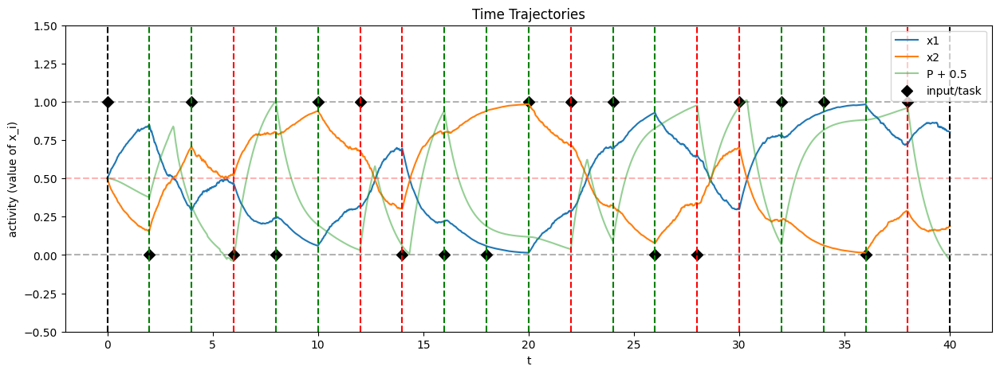

<Figure size 640x480 with 0 Axes>

In [ ]:
best_model_params = best_model_params.astype(float)
display(pd.DataFrame(best_model_params, index=['g', 'c', 'alpha', 'gamma'], columns=['mean_best_model']).T)

# plot model internal dynamics
# simulate the best fitted model with the mean parameters
data_best_fit = simulate_experiment(num_trials, T, x_0, *best_model_params, sigma, tau_P, bool_plot_trajectory=True)

if SAVE_RESULTS:
    full_file_name = os.path.join(RESULTS_DIR, subDir_modelComparison,'best_fitted_model_internal_dynamics.png')
    plt.savefig(full_file_name)
    print(f"Saved to {full_file_name}")